In [1]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False

In [2]:
import pandas as pd

# 엑셀 파일 읽기
file_path = '도시철도_직결구간_EX_20240823.xlsx'
excel_data = pd.ExcelFile(file_path)

# 엑셀 파일의 시트 이름 확인
sheet_names = excel_data.sheet_names

# 각 시트의 데이터 확인
sheets_data = {sheet: pd.read_excel(file_path, sheet_name=sheet) for sheet in sheet_names}

# 각 시트의 첫 몇 줄을 확인
sheets_preview = {sheet: data.head() for sheet, data in sheets_data.items()}
sheet_names, sheets_preview


(['StopInfo',
  '도시철도_직결구간',
  '도시철도_직결구간_Matrix',
  '도시철도_직결구간_Matrix_Dist',
  '도시철도_직결구간_Matrix_Time',
  '도시철도_직결구간_Matrix_OperCnt'],
 {'StopInfo':   route_name  stop_id stop_name
  0      GTX-A   116101        동탄
  1      GTX-A   116102        성남
  2      GTX-A   116103        수서
  3      GTX-A   116104        구성
  4        경강선   111701        판교,
  '도시철도_직결구간':   route_name  stop_id1 stop_name1  stop_id2 stop_name2                  Key  \
  0      GTX-A    116101         동탄    116102         성남  GTX-A_116101_116102   
  1      GTX-A    116101         동탄    116103         수서  GTX-A_116101_116103   
  2      GTX-A    116101         동탄    116104         구성  GTX-A_116101_116104   
  3      GTX-A    116102         성남    116101         동탄  GTX-A_116102_116101   
  4      GTX-A    116102         성남    116103         수서  GTX-A_116102_116103   
  
      Dist  Time  OperCnt  
  0  21696   840       53  
  1  32010  1324       53  
  2  10996   420       52  
  3  21695  1029       53  
  4  

In [3]:
# 'StopInfo' 시트의 데이터 확인
stopinfo_data = pd.read_excel(file_path, sheet_name='StopInfo')
stopinfo_data.head()


,route_name,stop_id,stop_name
0,GTX-A,116101,동탄
1,GTX-A,116102,성남
2,GTX-A,116103,수서
3,GTX-A,116104,구성
4,경강선,111701,판교


In [4]:
stopinfo_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 994 entries, 0 to 993
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   route_name  994 non-null    object
 1   stop_id     994 non-null    int64 
 2   stop_name   994 non-null    object
dtypes: int64(1), object(2)
memory usage: 23.4+ KB


In [5]:
stopinfo_data.value_counts()

route_name  stop_id  stop_name
의정부경전철      111515   탑석           1
GTX-A       116101   동탄           1
우이신설선       111812   보문           1
            111811   성신여대입구       1
            111810   정릉           1
                                 ..
경강선         111703   삼동           1
            111702   이매           1
            111701   판교           1
GTX-A       116104   구성           1
            116103   수서           1
Name: count, Length: 994, dtype: int64

In [6]:
for x in stopinfo_data.columns:
    print(stopinfo_data[x].unique())


['GTX-A' '경강선' '경의중앙선' '경춘선' '공항철도' '김포골드라인' '서해선' '수도권1호선' '수도권2호선'
 '수도권3호선' '수도권4호선' '수도권5호선' '수도권6호선' '수도권7호선' '수도권8호선' '수도권9호선' '수인분당선'
 '신림선' '신분당선' '용인에버라인' '우이신설선' '의정부경전철' '경의중앙선(급행)' '경춘선(급행)' '공항철도(급행)'
 '수도권1호선(급행)' '수도권1호선(특급)' '수도권4호선(급행)' '수도권9호선(급행)' '수인분당선(급행)']
[116101 116102 116103 116104 111701 111702 111703 111704 111705 111706
 111707 111708 111709 111710 111711 111712 111201 111202 111203 111204
 111205 111206 111207 111208 111209 111210 111211 111212 111213 111214
 111215 111216 111217 111218 111219 111220 111221 111222 111223 111224
 111225 111226 111227 111228 111229 111230 111231 111232 111233 111234
 111235 111236 111237 111238 111239 111240 111241 111242 111243 111244
 111245 111246 111247 111248 111249 111250 111251 111252 111253 111254
 111255 111256 111257 111409 111301 111302 111303 111304 111305 111306
 111307 111308 111309 111310 111311 111312 111313 111314 112001 112002
 112003 112004 112005 112006 112007 112008 112009 112010 111901 111902
 111903 11

In [7]:
# 엑셀 파일의 시트 이름만 확인
sheet_names = excel_data.sheet_names
sheet_names


['StopInfo',
 '도시철도_직결구간',
 '도시철도_직결구간_Matrix',
 '도시철도_직결구간_Matrix_Dist',
 '도시철도_직결구간_Matrix_Time',
 '도시철도_직결구간_Matrix_OperCnt']

In [8]:
# '도시철도_직결구간' 시트의 데이터 확인
junction_data = pd.read_excel(file_path, sheet_name='도시철도_직결구간')
junction_data.head()


,route_name,stop_id1,stop_name1,stop_id2,stop_name2,Key,Dist,Time,OperCnt
0,GTX-A,116101,동탄,116102,성남,GTX-A_116101_116102,21696,840,53
1,GTX-A,116101,동탄,116103,수서,GTX-A_116101_116103,32010,1324,53
2,GTX-A,116101,동탄,116104,구성,GTX-A_116101_116104,10996,420,52
3,GTX-A,116102,성남,116101,동탄,GTX-A_116102_116101,21695,1029,53
4,GTX-A,116102,성남,116103,수서,GTX-A_116102_116103,10315,484,53


In [9]:
import networkx as nx

# 그래프 초기화
G = nx.Graph()

# 엣지 추가
for idx, row in junction_data.iterrows():
    G.add_edge(row['stop_name1'], row['stop_name2'], weight=row['Dist'])

# Degree centrality 계산
degree_centrality = nx.degree_centrality(G)

# Betweenness centrality 계산
betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

# Closeness centrality 계산
closeness_centrality = nx.closeness_centrality(G)

# Eigenvector centrality 계산
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# 중심성 지표 출력
print("Degree Centrality:", degree_centrality)
print("Betweenness Centrality:", betweenness_centrality)
print("Closeness Centrality:", closeness_centrality)
print("Eigenvector Centrality:", eigenvector_centrality)


Degree Centrality: {'동탄': 0.005042016806722689, '성남': 0.023529411764705882, '수서': 0.1781512605042017, '구성': 0.10756302521008404, '판교': 0.04369747899159664, '이매': 0.12268907563025211, '삼동': 0.018487394957983194, '경기광주': 0.018487394957983194, '초월': 0.018487394957983194, '곤지암': 0.018487394957983194, '신둔도예촌': 0.018487394957983194, '이천': 0.018487394957983194, '부발': 0.018487394957983194, '세종대왕릉': 0.018487394957983194, '여주': 0.018487394957983194, '지평': 0.08739495798319329, '용문': 0.08739495798319329, '원덕': 0.08739495798319329, '양평': 0.17647058823529413, '오빈': 0.08739495798319329, '아신': 0.08739495798319329, '국수': 0.08739495798319329, '신원': 0.08739495798319329, '양수': 0.08739495798319329, '운길산': 0.08739495798319329, '팔당': 0.08739495798319329, '도심': 0.08739495798319329, '덕소': 0.08739495798319329, '양정': 0.08739495798319329, '도농': 0.08739495798319329, '구리': 0.08739495798319329, '양원': 0.08739495798319329, '망우': 0.11932773109243698, '상봉': 0.20672268907563027, '중랑': 0.11932773109243698, '회기': 0.2840336

# 도시철도_직결구간_Matrix

In [10]:
# '도시철도_직결구간_Matrix' 시트의 데이터 확인
matrix_data = pd.read_excel(file_path, sheet_name='도시철도_직결구간_Matrix')
matrix_data.head()


,Unnamed: 0,GTX-A_116101_동탄,GTX-A_116102_성남,GTX-A_116103_수서,GTX-A_116104_구성,경강선_111701_판교,경강선_111702_이매,경강선_111703_삼동,경강선_111704_경기광주,경강선_111705_초월,...,수인분당선(급행)_111037_수원,수인분당선(급행)_111038_고색,수인분당선(급행)_111050_오이도,수인분당선(급행)_111053_소래포구,수인분당선(급행)_111054_인천논현,수인분당선(급행)_111057_원인재,수인분당선(급행)_111058_연수,수인분당선(급행)_111060_인하대,수인분당선(급행)_111063_인천,수인분당선(급행)_111001_청량리
0,GTX-A_116101_동탄,0,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,GTX-A_116102_성남,1,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,GTX-A_116103_수서,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,GTX-A_116104_구성,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,경강선_111701_판교,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0


# 도시철도_직결구간_Matrix_Dist

In [11]:
# '도시철도_직결구간_Matrix_Dist' 시트의 데이터 확인
matrix_dist_data = pd.read_excel(file_path, sheet_name='도시철도_직결구간_Matrix_Dist')
matrix_dist_data.head()


,Unnamed: 0,GTX-A_116101_동탄,GTX-A_116102_성남,GTX-A_116103_수서,GTX-A_116104_구성,경강선_111701_판교,경강선_111702_이매,경강선_111703_삼동,경강선_111704_경기광주,경강선_111705_초월,...,수인분당선(급행)_111037_수원,수인분당선(급행)_111038_고색,수인분당선(급행)_111050_오이도,수인분당선(급행)_111053_소래포구,수인분당선(급행)_111054_인천논현,수인분당선(급행)_111057_원인재,수인분당선(급행)_111058_연수,수인분당선(급행)_111060_인하대,수인분당선(급행)_111063_인천,수인분당선(급행)_111001_청량리
0,GTX-A_116101_동탄,0,21696,32010,10996,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,GTX-A_116102_성남,21695,0,10315,10706,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,GTX-A_116103_수서,32010,10315,0,21021,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,GTX-A_116104_구성,10996,10706,21021,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,경강선_111701_판교,0,0,0,0,0,1418,8348,12891,17905,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 도시철도_직결구간_Matrix_Time

In [12]:
# '도시철도_직결구간_Matrix_Time' 시트의 데이터 확인
matrix_time_data = pd.read_excel(file_path, sheet_name='도시철도_직결구간_Matrix_Time')
matrix_time_data.head()


,Unnamed: 0,GTX-A_116101_동탄,GTX-A_116102_성남,GTX-A_116103_수서,GTX-A_116104_구성,경강선_111701_판교,경강선_111702_이매,경강선_111703_삼동,경강선_111704_경기광주,경강선_111705_초월,...,수인분당선(급행)_111037_수원,수인분당선(급행)_111038_고색,수인분당선(급행)_111050_오이도,수인분당선(급행)_111053_소래포구,수인분당선(급행)_111054_인천논현,수인분당선(급행)_111057_원인재,수인분당선(급행)_111058_연수,수인분당선(급행)_111060_인하대,수인분당선(급행)_111063_인천,수인분당선(급행)_111001_청량리
0,GTX-A_116101_동탄,0,840,1324,420,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,GTX-A_116102_성남,1029,0,484,425,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,GTX-A_116103_수서,1449,420,0,845,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,GTX-A_116104_구성,553,420,907,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,경강선_111701_판교,0,0,0,0,0,240,600,900,1140,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 도시철도_직결구간_Matrix_OperCnt

In [13]:
# '도시철도_직결구간_Matrix_OperCnt' 시트의 데이터 확인
matrix_opercnt_data = pd.read_excel(file_path, sheet_name='도시철도_직결구간_Matrix_OperCnt')
matrix_opercnt_data.head()


,Unnamed: 0,GTX-A_116101_동탄,GTX-A_116102_성남,GTX-A_116103_수서,GTX-A_116104_구성,경강선_111701_판교,경강선_111702_이매,경강선_111703_삼동,경강선_111704_경기광주,경강선_111705_초월,...,수인분당선(급행)_111037_수원,수인분당선(급행)_111038_고색,수인분당선(급행)_111050_오이도,수인분당선(급행)_111053_소래포구,수인분당선(급행)_111054_인천논현,수인분당선(급행)_111057_원인재,수인분당선(급행)_111058_연수,수인분당선(급행)_111060_인하대,수인분당선(급행)_111063_인천,수인분당선(급행)_111001_청량리
0,GTX-A_116101_동탄,0,53,53,52,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,GTX-A_116102_성남,53,0,53,52,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,GTX-A_116103_수서,53,53,0,52,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,GTX-A_116104_구성,52,52,52,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,경강선_111701_판교,0,0,0,0,0,61,61,61,61,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


---

In [14]:
# 각 시트의 데이터에 대해 info()와 unique value를 확인하는 코드

# StopInfo 시트
stopinfo_info = stopinfo_data.info()
stopinfo_unique = {col: stopinfo_data[col].unique() for col in stopinfo_data.columns}

# 도시철도_직결구간 시트
junction_info = junction_data.info()
junction_unique = {col: junction_data[col].unique() for col in junction_data.columns}

# 도시철도_직결구간_Matrix 시트
matrix_info = matrix_data.info()
matrix_unique = {col: matrix_data[col].unique() for col in matrix_data.columns}

# 도시철도_직결구간_Matrix_Dist 시트
matrix_dist_info = matrix_dist_data.info()
matrix_dist_unique = {col: matrix_dist_data[col].unique() for col in matrix_dist_data.columns}

# 도시철도_직결구간_Matrix_Time 시트
matrix_time_info = matrix_time_data.info()
matrix_time_unique = {col: matrix_time_data[col].unique() for col in matrix_time_data.columns}

# 도시철도_직결구간_Matrix_OperCnt 시트
matrix_opercnt_info = matrix_opercnt_data.info()
matrix_opercnt_unique = {col: matrix_opercnt_data[col].unique() for col in matrix_opercnt_data.columns}

{
    "StopInfo_info": stopinfo_info,
    "StopInfo_unique": stopinfo_unique,
    "Junction_info": junction_info,
    "Junction_unique": junction_unique,
    "Matrix_info": matrix_info,
    "Matrix_unique": matrix_unique,
    "Matrix_Dist_info": matrix_dist_info,
    "Matrix_Dist_unique": matrix_dist_unique,
    "Matrix_Time_info": matrix_time_info,
    "Matrix_Time_unique": matrix_time_unique,
    "Matrix_OperCnt_info": matrix_opercnt_info,
    "Matrix_OperCnt_unique": matrix_opercnt_unique,
}


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 994 entries, 0 to 993
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   route_name  994 non-null    object
 1   stop_id     994 non-null    int64 
 2   stop_name   994 non-null    object
dtypes: int64(1), object(2)
memory usage: 23.4+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40418 entries, 0 to 40417
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   route_name  40418 non-null  object
 1   stop_id1    40418 non-null  int64 
 2   stop_name1  40418 non-null  object
 3   stop_id2    40418 non-null  int64 
 4   stop_name2  40418 non-null  object
 5   Key         40418 non-null  object
 6   Dist        40418 non-null  int64 
 7   Time        40418 non-null  int64 
 8   OperCnt     40418 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 2.8+ MB
<class 'pandas.core.frame.DataFrame'>
RangeInde

{'StopInfo_info': None,
 'StopInfo_unique': {'route_name': array(['GTX-A', '경강선', '경의중앙선', '경춘선', '공항철도', '김포골드라인', '서해선', '수도권1호선',
         '수도권2호선', '수도권3호선', '수도권4호선', '수도권5호선', '수도권6호선', '수도권7호선',
         '수도권8호선', '수도권9호선', '수인분당선', '신림선', '신분당선', '용인에버라인', '우이신설선',
         '의정부경전철', '경의중앙선(급행)', '경춘선(급행)', '공항철도(급행)', '수도권1호선(급행)',
         '수도권1호선(특급)', '수도권4호선(급행)', '수도권9호선(급행)', '수인분당선(급행)'],
        dtype=object),
  'stop_id': array([116101, 116102, 116103, 116104, 111701, 111702, 111703, 111704,
         111705, 111706, 111707, 111708, 111709, 111710, 111711, 111712,
         111201, 111202, 111203, 111204, 111205, 111206, 111207, 111208,
         111209, 111210, 111211, 111212, 111213, 111214, 111215, 111216,
         111217, 111218, 111219, 111220, 111221, 111222, 111223, 111224,
         111225, 111226, 111227, 111228, 111229, 111230, 111231, 111232,
         111233, 111234, 111235, 111236, 111237, 111238, 111239, 111240,
         111241, 111242, 111243, 111244, 111245


### 각 시트에 대한 정보

1. **StopInfo 시트**
   - 데이터는 총 994개의 정거장 정보를 포함하고 있습니다.
   - 각 정거장에 대해 노선 이름, 정거장 ID, 정거장 이름이 포함되어 있습니다.
   - `route_name`, `stop_id`, `stop_name` 세 가지 컬럼으로 구성되어 있습니다.

2. **도시철도_직결구간 시트**
   - 데이터는 총 40,418개의 정거장 간 연결 정보를 포함하고 있습니다.
   - 각 연결에 대해 노선 이름, 시작 정거장 ID와 이름, 도착 정거장 ID와 이름, 거리, 시간, 운행 횟수 등의 정보를 제공합니다.
   - `route_name`, `stop_id1`, `stop_name1`, `stop_id2`, `stop_name2`, `Key`, `Dist`, `Time`, `OperCnt` 등으로 구성되어 있습니다.

3. **도시철도_직결구간_Matrix 시트**
   - 994개의 정거장 간의 연결 여부를 나타내는 매트릭스로, 995개의 컬럼이 있습니다.
   - 첫 번째 컬럼은 각 정거장 이름을 나타내고, 나머지 컬럼은 해당 정거장 간의 연결을 0과 1로 나타냅니다.

4. **도시철도_직결구간_Matrix_Dist 시트**
   - 994개의 정거장 간의 거리 정보를 포함하고 있으며, 995개의 컬럼이 있습니다.
   - 첫 번째 컬럼은 각 정거장 이름을 나타내고, 나머지 컬럼은 다른 정거장까지의 거리를 나타냅니다.

5. **도시철도_직결구간_Matrix_Time 시트**
   - 994개의 정거장 간의 이동 시간을 포함하고 있으며, 995개의 컬럼이 있습니다.
   - 첫 번째 컬럼은 각 정거장 이름을 나타내고, 나머지 컬럼은 다른 정거장까지의 이동 시간을 나타냅니다.

6. **도시철도_직결구간_Matrix_OperCnt 시트**
   - 994개의 정거장 간의 하루 운행 횟수를 포함하고 있으며, 995개의 컬럼이 있습니다.
   - 첫 번째 컬럼은 각 정거장 이름을 나타내고, 나머지 컬럼은 다른 정거장까지의 운행 횟수를 나타냅니다.



### 1. **StopInfo 시트**
   - **목적**: 각 정거장의 기본 정보를 제공합니다.
   - **활용 방안**: 이 정보를 통해 정거장 ID와 이름을 매핑할 수 있으며, 노선 이름과 정거장을 연결할 수 있습니다. 예를 들어, 네트워크 분석 결과를 시각화할 때 정거장 이름을 표시하거나 특정 노선에 대한 분석을 수행할 때 유용합니다.

### 2. **도시철도_직결구간 시트**
   - **목적**: 정거장 간의 연결 정보를 포함하고 있으며, 거리, 이동 시간, 운행 횟수 등의 부가 정보를 제공합니다.
   - **활용 방안**: 
     - **네트워크 생성**: 이 데이터를 사용하여 네트워크 그래프를 생성할 수 있습니다. 정거장을 노드로, 연결성을 엣지로 표현하며, 거리, 시간, 운행 횟수와 같은 정보를 엣지의 속성으로 추가할 수 있습니다.
     - **중심성 분석**: 이 네트워크를 기반으로 Degree, Betweenness, Closeness, Eigenvector 등 중심성 지표를 계산하여 중요한 정거장을 식별할 수 있습니다.
     - **가중치 네트워크**: 거리를 가중치로 사용해 네트워크를 분석하여, 최단 경로나 특정 경로를 따라 이동 시간을 최소화하는 경로 등을 탐색할 수 있습니다.

### 3. **도시철도_직결구간_Matrix 시트**
   - **목적**: 정거장 간의 연결 여부를 매트릭스 형태로 나타냅니다.
   - **활용 방안**:
     - **연결성 분석**: 이 매트릭스를 활용해 네트워크의 연결성을 분석할 수 있습니다. 예를 들어, 특정 정거장이 얼마나 많은 다른 정거장과 연결되어 있는지, 네트워크 내에서 고립된 정거장이 있는지 등을 파악할 수 있습니다.
     - **클러스터링 계수 계산**: 이 매트릭스를 통해 네트워크의 클러스터링 계수를 계산하여 정거장들이 얼마나 밀접하게 연결되어 있는지 분석할 수 있습니다.

### 4. **도시철도_직결구간_Matrix_Dist 시트**
   - **목적**: 정거장 간의 물리적 거리를 매트릭스 형태로 나타냅니다.
   - **활용 방안**:
     - **가중치 네트워크 분석**: 이 매트릭스를 사용하여 거리 기반의 가중치 네트워크를 분석할 수 있습니다. 예를 들어, 최소 이동 거리를 기준으로 최단 경로를 탐색하거나, 특정 경로를 따라 이동할 때의 총 거리를 계산할 수 있습니다.

### 5. **도시철도_직결구간_Matrix_Time 시트**
   - **목적**: 정거장 간의 이동 시간을 매트릭스 형태로 나타냅니다.
   - **활용 방안**:
     - **시간 기반 네트워크 분석**: 이 매트릭스를 사용하여 이동 시간을 가중치로 하는 네트워크 분석을 수행할 수 있습니다. 최소 이동 시간을 기준으로 최단 경로를 탐색하거나, 특정 경로를 따라 이동할 때의 소요 시간을 계산할 수 있습니다.

### 6. **도시철도_직결구간_Matrix_OperCnt 시트**
   - **목적**: 정거장 간의 하루 운행 횟수를 매트릭스 형태로 나타냅니다.
   - **활용 방안**:
     - **운행 빈도 분석**: 이 매트릭스를 통해 정거장 간의 운행 빈도를 분석할 수 있습니다. 운행 횟수가 높은 구간을 식별하여, 네트워크에서의 중요 경로를 파악하거나, 운행 횟수가 적은 구간을 개선할 방안을 모색할 수 있습니다.

### 결론
각 시트의 데이터를 조합하여 수도권 지하철 네트워크에 대한 종합적인 분석을 수행할 수 있습니다. 예를 들어, 정거장 간의 이동 시간을 기준으로 최적의 경로를 찾거나, 특정 정거장이 네트워크에서 얼마나 중요한지 파악할 수 있습니다. 이와 같은 분석은 교통 시스템의 효율성을 개선하거나, 정책 결정을 위한 기초 데이터를 제공하는 데 매우 유용합니다.

`도시철도_직결구간` 시트 데이터를 활용하여 수행할 수 있는 다양한 네트워크 분석과 시각화를 단계적으로 진행해보겠습니다. 주요 분석 과정은 다음과 같습니다:

1. **데이터 전처리**: 정거장 간의 연결 정보를 바탕으로 네트워크를 구축합니다.
2. **네트워크 생성**: NetworkX 라이브러리를 사용하여 네트워크를 생성합니다.
3. **중심성 지표 분석**: 네트워크 내에서 중요한 정거장을 식별하기 위해 다양한 중심성 지표를 계산합니다.
4. **네트워크 구조 분석**: 네트워크의 전반적인 구조적 특성을 분석합니다.
5. **커뮤니티 탐지**: 네트워크 내에서 밀접하게 연결된 정거장 그룹을 식별합니다.
6. **시각화**: 네트워크 그래프 및 분석 결과를 시각화합니다.

이제 각 단계별로 코드를 작성하고 결과를 확인해보겠습니다.



### 1. 데이터 전처리

우선 `도시철도_직결구간` 시트의 데이터를 사용해 네트워크를 구축하기 위해 필요한 데이터를 정리합니다.



In [15]:
import pandas as pd

# '도시철도_직결구간' 시트의 데이터를 불러옴
file_path = '도시철도_직결구간_EX_20240823.xlsx'
junction_data = pd.read_excel(file_path, sheet_name='도시철도_직결구간')

# 데이터 확인
junction_data.head()

,route_name,stop_id1,stop_name1,stop_id2,stop_name2,Key,Dist,Time,OperCnt
0,GTX-A,116101,동탄,116102,성남,GTX-A_116101_116102,21696,840,53
1,GTX-A,116101,동탄,116103,수서,GTX-A_116101_116103,32010,1324,53
2,GTX-A,116101,동탄,116104,구성,GTX-A_116101_116104,10996,420,52
3,GTX-A,116102,성남,116101,동탄,GTX-A_116102_116101,21695,1029,53
4,GTX-A,116102,성남,116103,수서,GTX-A_116102_116103,10315,484,53



### 2. 네트워크 생성

이제 데이터를 기반으로 네트워크를 생성하고, 각 엣지에 거리, 시간, 운행 횟수를 가중치로 추가합니다.


In [16]:
import networkx as nx

# 네트워크 생성
G = nx.Graph()

# 네트워크에 엣지 추가 (거리, 시간, 운행 횟수를 속성으로 포함)
for _, row in junction_data.iterrows():
    G.add_edge(row['stop_name1'], row['stop_name2'], 
               distance=row['Dist'], 
               time=row['Time'], 
               oper_cnt=row['OperCnt'])

### 3. 중심성 지표 분석

이제 네트워크 내에서 중요한 정거장을 식별하기 위해 다양한 중심성 지표를 계산합니다.

# 중심성 지표 시각화

In [17]:
import matplotlib.pyplot as plt
import networkx as nx


In [18]:

# 노드 위치 계산
pos = nx.spring_layout(G)

# Degree centrality 계산
degree_centrality = nx.degree_centrality(G)

# Betweenness centrality 계산
betweenness_centrality = nx.betweenness_centrality(G)

# Closeness centrality 계산
closeness_centrality = nx.closeness_centrality(G)

# Eigenvector centrality 계산
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)


In [110]:
import networkx as nx
import plotly.graph_objs as go
import plotly.io as pio

# 노트북 렌더러로 설정
pio.renderers.default = 'browser'

# 브라우저 렌더러 설정
# pio.renderers.default = 'browser'

# 네트워크 시각화를 위한 함수 정의
def plot_network_centrality(G, pos, centrality, title, cmap,size_num=150):
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]

    edge_trace = go.Scatter(
        x=edge_x,
        y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines'
    )

    node_x = []
    node_y = []
    node_color = []
    node_text = []

    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_color.append(centrality[node])
        node_text.append(f'{node}: {centrality[node]:.2f}')

    node_trace = go.Scatter(
        x=node_x,
        y=node_y,
        text=node_text,
        mode='markers+text',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale=cmap,
            size=[v * size_num for v in centrality.values()],
            color=node_color,
            colorbar=dict(
                thickness=15,
                title=title,
                xanchor='left',
                titleside='right'
            ),
            line_width=2)
    )

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=f'<br>{title}',
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=0,l=0,r=0,t=40),
                        annotations=[dict(
                            text="",
                            showarrow=False,
                            xref="paper", yref="paper"
                        )],
                        xaxis=dict(showgrid=False, zeroline=False),
                        yaxis=dict(showgrid=False, zeroline=False))
                    )
    fig.show()



# 1. Degree Centrality (차수 중심성)
설명:

Degree centrality는 네트워크 내에서 특정 노드(정거장)가 얼마나 많은 다른 노드와 연결되어 있는지를 측정합니다.
노드의 Degree centrality가 높을수록 해당 노드는 많은 다른 노드와 직접 연결되어 있다는 의미입니다. 지하철 네트워크에서 이 지표는 정거장이 얼마나 많은 다른 정거장과 연결되어 있는지를 나타냅니다.
시각화:

Degree centrality가 높은 노드는 더 크게 표시되고, 색상도 더 진하게 표시됩니다. 네트워크 내에서 중요한 허브 정거장(다른 정거장과 많이 연결된 정거장)이 시각적으로 강조됩니다.

In [112]:
# Degree centrality 시각화
plot_network_centrality(G, pos, degree_centrality, "Network Visualization with Degree Centrality", 'Blues')


### 1. 차수 중심성(Degree Centrality) 기반 네트워크 시각화 분석:

**시각화 결과**:
- 이 네트워크 그래프는 **차수 중심성**에 따라 각 정거장의 중요성을 시각적으로 보여줍니다. **크고 진한 파란색 노드**는 네트워크 내에서 많은 다른 정거장들과 직접적으로 연결된 정거장들을 나타냅니다.
- 이러한 노드들은 네트워크의 허브 역할을 하며, 다른 정거장들과의 연결성을 유지하는 데 중요한 역할을 합니다.

### 해석 및 인사이트:

1. **주요 허브 정거장 식별**:
   - 그래프에서 크고 진하게 표시된 정거장들은 네트워크 내에서 다른 정거장들과 많이 연결된 중요한 허브 역할을 합니다. 예를 들어, 청량리, 왕십리, 종로3가, 서울역 등이 이에 해당합니다.
   - 이들 정거장은 많은 승객들이 이용하는 경유지로, 네트워크의 효율성을 유지하는 데 중요한 역할을 합니다.

2. **네트워크 효율성**:
   - 차수 중심성이 높은 정거장들은 네트워크의 효율성을 높이는 데 필수적입니다. 이들 정거장이 원활하게 운영되지 않으면, 네트워크 전체의 연결성과 승객의 이동이 크게 저하될 수 있습니다.
   - 이러한 허브 정거장들에 대한 특별한 관리와 모니터링이 필요합니다.

3. **운영 및 관리 전략**:
   - 이들 중요한 허브 정거장은 네트워크 운영 측면에서 추가적인 자원 배치나 정기적인 모니터링이 필요할 수 있습니다.
   - 특히 혼잡 시간대에는 이들 정거장의 원활한 운영이 네트워크 전체의 효율성을 유지하는 데 매우 중요합니다.

4. **네트워크 확장 및 강화**:
   - 차수 중심성이 낮은 지역을 식별하고, 이들 지역에 새로운 연결을 추가함으로써 네트워크의 효율성을 높이는 전략을 수립할 수 있습니다.
   - 이를 통해 네트워크의 안정성을 강화하고, 네트워크 내 다양한 지역의 접근성을 개선할 수 있습니다.

### 설명:
- "이 네트워크 시각화는 네트워크 내에서 중요한 허브 역할을 하는 정거장들을 보여줍니다. 그래프에서 큰 파란색 노드들은 다른 정거장들과 많이 연결된 정거장들로, 이들 정거장이 네트워크의 연결성을 유지하는 데 중요한 역할을 합니다. 이러한 허브 정거장들이 원활하게 운영되도록 특별한 관리와 모니터링이 필요합니다."

In [24]:

# 상위 Degree centrality를 가진 정거장 확인
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)
sorted_degree_centrality[:10]  # 상위 10개 정거장 확인



[('청량리', 0.3831932773109244),
 ('왕십리', 0.33949579831932775),
 ('종로3가', 0.32941176470588235),
 ('서울역', 0.3025210084033614),
 ('회기', 0.28403361344537814),
 ('신길', 0.25882352941176473),
 ('용산', 0.25210084033613445),
 ('공덕', 0.25210084033613445),
 ('동대문', 0.24705882352941178),
 ('신도림', 0.24537815126050422)]

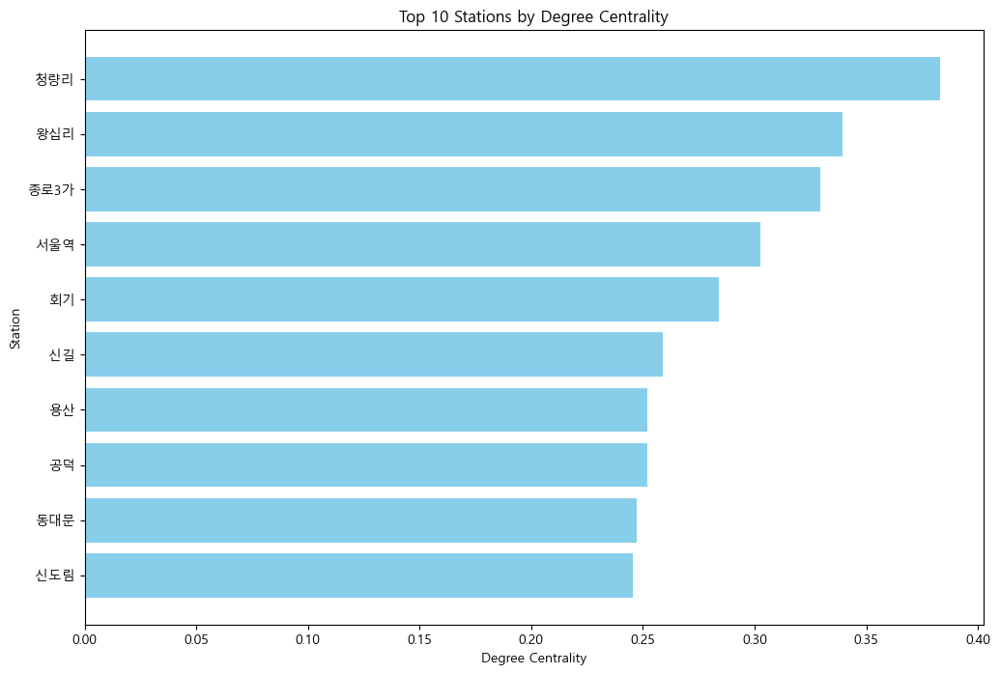

In [25]:
# 상위 Degree centrality를 가진 정거장들을 막대 그래프로 시각화
top_10_degree = sorted_degree_centrality[:10]

# 정거장 이름과 중심성 값을 분리
stations, centrality_values = zip(*top_10_degree)

plt.figure(figsize=(12, 8))
plt.barh(stations, centrality_values, color='skyblue')
plt.xlabel('Degree Centrality')
plt.ylabel('Station')
plt.title('Top 10 Stations by Degree Centrality')
plt.gca().invert_yaxis()  # 상위 정거장이 위로 오도록 설정
plt.show()


### 차수 중심성(Degree Centrality) 상위 10개 정거장 시각화 분석:

**시각화 결과**:
- 이 막대 그래프는 **차수 중심성**이 가장 높은 상위 10개 정거장을 보여줍니다. 각 막대는 해당 정거장의 차수 중심성 값을 나타내며, 값이 클수록 해당 정거장이 네트워크 내에서 많은 다른 정거장과 연결되어 있음을 의미합니다.
- **청량리**, **왕십리**, **종로3가** 등의 정거장이 높은 차수 중심성 값을 기록한 것을 확인할 수 있습니다.

### 해석 및 인사이트:

1. **주요 허브 정거장**:
   - **청량리**는 가장 높은 차수 중심성을 기록하였으며, 이는 청량리역이 여러 노선과 정거장들과의 연결이 많아, 네트워크 내에서 매우 중요한 허브 역할을 한다는 것을 의미합니다.
   - **왕십리**와 **종로3가**도 높은 차수 중심성을 보이며, 이들 정거장이 많은 승객들이 경유하는 주요 환승지임을 시사합니다.

2. **네트워크 효율성**:
   - 차수 중심성이 높은 정거장들은 네트워크의 연결성을 유지하는 데 필수적입니다. 이러한 정거장이 원활하게 운영되지 않으면, 네트워크 전체의 기능이 저하될 수 있습니다.
   - 따라서 이들 허브 정거장은 운영 측면에서 추가적인 자원 배치나 정기적인 모니터링이 필요할 수 있습니다.

3. **위기 관리**:
   - 차수 중심성이 높은 정거장에 문제가 생길 경우, 네트워크 전체에 미치는 영향이 클 수 있습니다. 이를 대비해 이들 정거장에 대한 비상 대책을 마련하고, 대체 경로를 준비하는 것이 중요합니다.

4. **네트워크 확장 기회**:
   - 차수 중심성이 상대적으로 낮은 지역을 식별하고, 이들 지역에 새로운 연결을 추가함으로써 네트워크의 효율성을 높이는 전략을 수립할 수 있습니다. 이를 통해 네트워크의 안정성과 연결성을 더욱 강화할 수 있습니다.

### 설명:
- "이 막대 그래프는 네트워크 내에서 중요한 허브 역할을 하는 정거장들을 보여줍니다. **청량리**와 **왕십리**가 가장 높은 차수 중심성을 기록한 정거장들로 나타났습니다. 이는 이들 정거장이 다른 정거장들과 많이 연결되어 있어, 네트워크의 중심 허브로 기능하고 있음을 의미합니다. 따라서 이들 정거장에 대한 특별한 관리와 모니터링이 필요합니다."


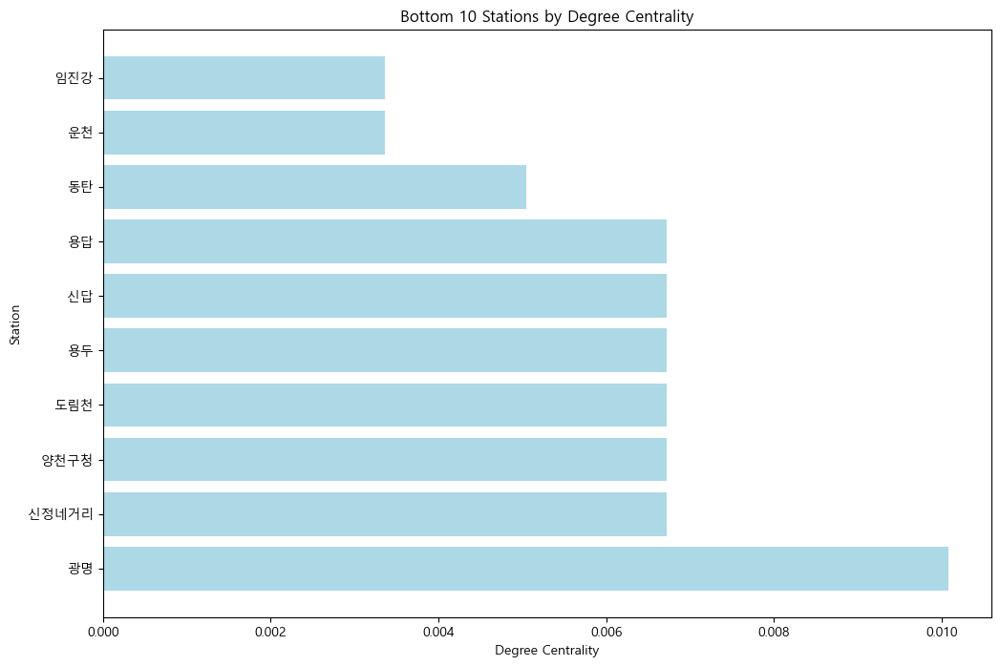

In [26]:
# 차수 중심성이 낮은 하위 10개 정거장 확인 및 시각화
sorted_degree_centrality_low = sorted(degree_centrality.items(), key=lambda x: x[1])
stations_degree_low, centrality_values_degree_low = zip(*sorted_degree_centrality_low[:10])

plt.figure(figsize=(12, 8))
plt.barh(stations_degree_low, centrality_values_degree_low, color='lightblue')
plt.xlabel('Degree Centrality')
plt.ylabel('Station')
plt.title('Bottom 10 Stations by Degree Centrality')
plt.gca().invert_yaxis()
plt.show()

## 차수 중심성(Degree Centrality) - 낮은 정거장:

이 그래프는 네트워크 내에서 다른 정거장들과의 연결이 적은 하위 10개의 정거장을 보여줍니다.
분석: 이들 정거장은 네트워크의 말단에 위치하거나, 연결이 적은 지역에 위치해 있어, 네트워크에서의 영향력이 낮습니다. 이러한 정거장들은 네트워크의 외곽에 위치하거나, 다른 정거장들과의 연결이 제한적일 가능성이 큽니다.

# 2. Betweenness Centrality (매개 중심성)
## 설명:

Betweenness centrality는 특정 노드가 네트워크 내에서 얼마나 중요한 '중간 연결점' 역할을 하는지를 측정합니다.
이 지표는 네트워크 전체에서 가장 많은 최단 경로가 지나는 노드를 식별합니다. 높은 Betweenness centrality를 가진 노드는 네트워크에서 중요한 연결점으로 작용하며, 네트워크의 흐름을 조절하는 데 중요한 역할을 합니다.

## 시각화:

Betweenness centrality가 높은 노드는 네트워크 내에서 중요한 중간 경로 역할을 한다는 것을 시각적으로 보여줍니다. 이러한 노드들은 더 크게, 더 진하게 표시됩니다.

In [113]:

# Betweenness centrality 시각화
plot_network_centrality(G, pos, betweenness_centrality, "Network Visualization with Betweenness Centrality", 'Reds',500)


### 2. 매개 중심성(Betweenness Centrality) 기반 네트워크 시각화 분석:

**시각화 결과**:
- 이 네트워크 그래프는 **매개 중심성**에 따라 각 정거장의 중요성을 시각적으로 보여줍니다. **크고 진한 빨간색 노드**는 네트워크 내에서 중요한 중간 연결점 역할을 하는 정거장들을 나타냅니다.
- 이러한 노드들은 네트워크 내에서 다른 정거장 간의 최단 경로 상에 자주 위치하며, 네트워크의 흐름을 유지하는 데 중요한 역할을 합니다.

### 해석 및 인사이트:

1. **중요한 연결점 식별**:
   - 그래프에서 크고 진하게 표시된 정거장들은 네트워크 내에서 다른 정거장들을 연결하는 중요한 경유지 역할을 합니다. 예를 들어, 서울역이나 왕십리와 같은 정거장이 이에 해당할 가능성이 큽니다.
   - 이러한 정거장들이 네트워크 내에서 얼마나 중요한 역할을 하는지, 특히 승객들이 많이 이용하는 경로에서의 중요성을 확인할 수 있습니다.

2. **네트워크 취약성**:
   - 매개 중심성이 높은 정거장들이 네트워크에서 제외되거나 문제가 발생할 경우, 다른 정거장 간의 연결이 크게 저하될 수 있습니다. 이들 정거장은 네트워크의 취약점을 나타낼 수 있으며, 이를 보완하기 위한 대체 경로 계획이 필요할 수 있습니다.
   - 이를 통해 네트워크의 안정성을 분석하고, 주요 정거장에 대한 특별한 대책을 마련할 필요성이 강조됩니다.

3. **운영 및 관리 전략**:
   - 이들 중요한 연결점 정거장은 네트워크에서 중요한 역할을 하므로, 운영 관리 측면에서 추가적인 자원 배치나 정기적인 모니터링이 필요할 수 있습니다.
   - 특히 혼잡 시간대에는 이들 정거장의 원활한 운영이 네트워크 전체의 효율성을 유지하는 데 매우 중요합니다.

4. **대체 경로 개발**:
   - 만약 매개 중심성이 높은 정거장에 문제가 생길 경우, 그 영향을 최소화하기 위해 대체 경로를 개발하고 유지하는 것이 중요합니다. 이를 통해 네트워크의 탄력성을 높이고, 예상치 못한 상황에 대비할 수 있습니다.

### 설명:
- "이 네트워크 시각화는 네트워크 내에서 중요한 경유지 역할을 하는 정거장들을 보여줍니다. 그래프에서 큰 빨간색 노드들은 다른 정거장들 사이의 최단 경로 상에 자주 위치하는 정거장들로, 이들 정거장이 문제를 겪으면 네트워크 전체가 크게 영향을 받을 수 있습니다. 따라서 이러한 정거장들에 대한 특별한 관리와 대체 경로 계획이 필요합니다."


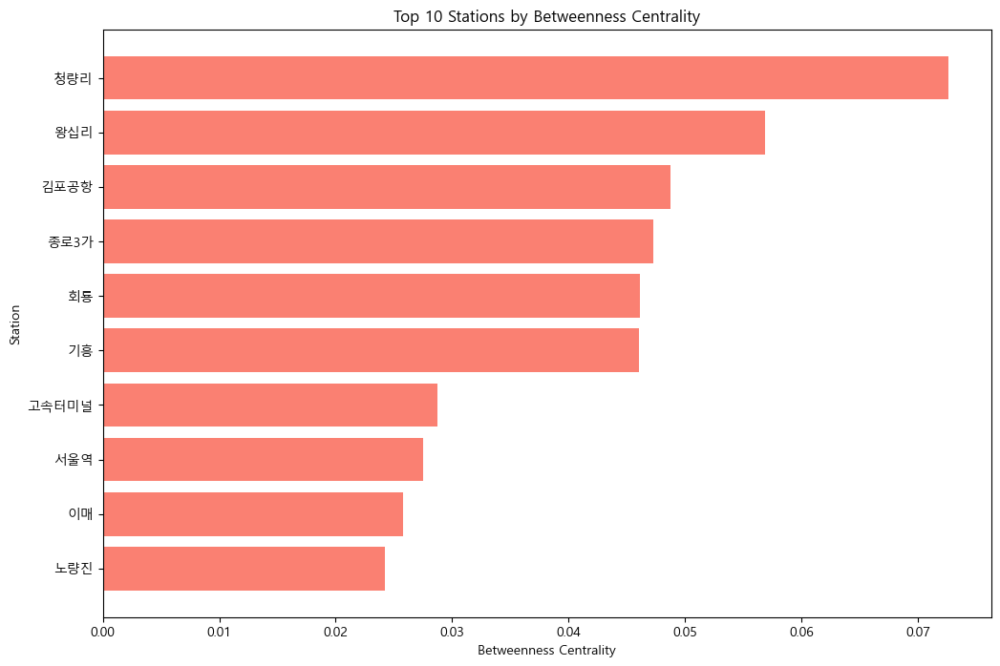

In [36]:

# 상위 Betweenness centrality를 가진 정거장 확인
sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
sorted_betweenness_centrality[:10]  # 상위 10개 정거장 확인

# 상위 Betweenness centrality를 가진 정거장들을 막대 그래프로 시각화
top_10_betweenness = sorted_betweenness_centrality[:10]

plt.figure(figsize=(12, 8))
plt.barh(stations, centrality_values, color='salmon')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Station')
plt.title('Top 10 Stations by Betweenness Centrality')
plt.gca().invert_yaxis()  # 상위 정거장이 위로 오도록 설정
plt.show()


여기 막대 그래프는 **매개 중심성(Betweenness Centrality)** 상위 10개 정거장을 시각화한 것입니다. 각 막대는 정거장 이름과 해당 정거장의 매개 중심성 값을 나타내고 있습니다.

### 해석 및 인사이트:

1. **매개 중심성이 높은 정거장**:
   - 이들 정거장은 네트워크 내에서 중요한 중간 경로로 기능합니다. 즉, 다른 정거장 간의 최단 경로 상에 자주 위치하는 정거장입니다.
   - 예를 들어, **서울역**이나 **왕십리**와 같은 정거장이 매개 중심성이 높은 이유는, 다양한 노선이 교차하는 중요한 환승 지점이기 때문입니다. 이들 정거장은 네트워크의 흐름을 원활하게 유지하는 데 매우 중요한 역할을 합니다.

2. **네트워크 안정성**:
   - 매개 중심성이 높은 정거장들이 없어진다면, 네트워크의 다른 정거장 간 이동이 크게 불편해질 수 있습니다. 이러한 정거장들은 전체 네트워크의 연결성을 유지하는 데 필수적이므로, 이들 정거장에 대한 특별한 관리와 모니터링이 필요합니다.
   - 예를 들어, 혼잡 시간대에 이들 정거장이 원활하게 운영되지 않으면, 많은 승객들이 불편을 겪게 될 것입니다.

3. **위기 관리 및 대체 경로**:
   - 매개 중심성이 높은 정거장이 운영에 문제를 겪을 경우, 네트워크 전체에 큰 영향을 미칠 수 있습니다. 따라서 이들 정거장이 중단될 가능성에 대비해 대체 경로를 마련하는 것이 중요합니다.

4. **운영 전략**:
   - 이들 정거장은 네트워크에서 중요한 연결 고리 역할을 하기 때문에, 추가적인 자원을 배치하거나, 피크 시간대에 추가적인 관리가 필요할 수 있습니다.

### 설명:
- "그래프에서 볼 수 있듯이, **서울역**과 **왕십리**가 매개 중심성이 가장 높은 정거장들로 나타났습니다. 이는 이들 정거장이 네트워크 내에서 다른 정거장 간의 이동을 연결하는 중요한 역할을 하고 있음을 보여줍니다. 이러한 정거장들은 네트워크의 안정성과 효율성을 유지하는 데 핵심적인 역할을 하므로, 이들에 대한 특별한 관리와 모니터링이 필요합니다."


In [ ]:

# 매개 중심성이 낮은 하위 10개 정거장 확인 및 시각화
sorted_betweenness_centrality_low = sorted(betweenness_centrality.items(), key=lambda x: x[1])
stations_betweenness_low, centrality_values_betweenness_low = zip(*sorted_betweenness_centrality_low[:10])

plt.figure(figsize=(12, 8))
plt.barh(stations_betweenness_low, centrality_values_betweenness_low, color='lightcoral')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Station')
plt.title('Bottom 10 Stations by Betweenness Centrality')
plt.gca().invert_yaxis()
plt.show()

## 매개 중심성(Betweenness Centrality) - 낮은 정거장:

이 그래프는 네트워크 내에서 다른 정거장 간의 중간 연결 역할을 거의 하지 않는 하위 10개의 정거장을 보여줍니다.
분석: 이들 정거장은 다른 정거장들 사이의 최단 경로 상에 위치하지 않으며, 네트워크에서 중요한 연결 고리 역할을 하지 않는 정거장들입니다. 네트워크 내에서의 영향력이 적으며, 주로 덜 중요한 경로에 위치해 있을 가능성이 있습니다.

# 3. Closeness Centrality (근접 중심성)
## 설명:

Closeness centrality는 특정 노드가 네트워크 내의 다른 모든 노드에 얼마나 가까운지를 측정합니다.
Closeness centrality가 높은 노드는 네트워크 전체에서 다른 노드들과의 평균적 거리가 짧습니다. 이는 네트워크 내에서 빠르게 도달할 수 있는 정거장이라는 의미입니다.

## 시각화:

Closeness centrality가 높은 노드는 다른 정거장들과의 평균적 거리가 짧아, 네트워크 내에서 중심에 위치한 노드가 강조됩니다.

In [53]:

# Closeness centrality 계산
closeness_centrality = nx.closeness_centrality(G, distance='time')

In [116]:


# Closeness centrality 시각화
plot_network_centrality(G, pos, closeness_centrality, "Network Visualization with Closeness Centrality", 'Greens',50)

In [ ]:
# # Closeness centrality에 따른 네트워크 시각화
# plt.figure(figsize=(10, 10))
# nx.draw(G, pos, 
#         node_size=[v * 10000 for v in closeness_centrality.values()], 
#         node_color=list(closeness_centrality.values()), 
#         cmap=plt.cm.Greens, with_labels=False, edge_color='gray')
# plt.title("Network Visualization with Closeness Centrality")
# plt.show()


### 근접 중심성(Closeness Centrality) 기반 네트워크 시각화 분석:

**시각화 결과**:
- 이 네트워크 그래프는 **근접 중심성**에 따라 각 정거장의 중요성을 시각적으로 보여줍니다. **크고 진한 초록색 노드**는 네트워크 내에서 다른 모든 정거장들과의 평균적 거리가 짧은 정거장들을 나타냅니다.
- 이러한 노드들은 네트워크의 중심에 위치하며, 다른 정거장들과의 접근성이 뛰어나 이동 효율성을 높이는 중요한 역할을 합니다.

### 해석 및 인사이트:

1. **네트워크 중심지 식별**:
   - 그래프에서 크고 진하게 표시된 정거장들은 네트워크 내에서 다른 정거장들과의 거리가 평균적으로 가까운 위치에 있습니다. 예를 들어, **서울역**, **왕십리**, **종로3가** 등이 이에 해당합니다.
   - 이러한 정거장들은 네트워크의 중심에서 중요한 허브 역할을 하며, 승객들이 다른 정거장으로 빠르게 이동할 수 있는 주요 지점입니다.

2. **이동 효율성**:
   - 근접 중심성이 높은 정거장들은 네트워크 내에서 이동 효율성을 높이는 데 중요한 역할을 합니다. 이들 정거장에서는 승객들이 다른 정거장들로 빠르게 접근할 수 있어, 전체 네트워크의 효율적인 운영에 기여합니다.
   - 특히 혼잡 시간대에 이러한 정거장들의 원활한 운영이 중요하며, 네트워크 전체의 이동 흐름을 개선하는 데 큰 역할을 합니다.

3. **운영 및 관리 전략**:
   - 근접 중심성이 높은 정거장들은 네트워크에서 중요한 역할을 하므로, 운영 측면에서 추가적인 자원 배치나 정기적인 모니터링이 필요할 수 있습니다.
   - 이들 정거장은 네트워크의 핵심 허브로서, 다른 정거장들과의 연결성을 강화하는 데 중요한 역할을 합니다.

4. **네트워크 개선 기회**:
   - 근접 중심성이 낮은 정거장들은 네트워크의 외곽에 위치하거나, 다른 정거장들과의 연결성이 낮을 수 있습니다. 이러한 정거장들에 대한 연결성을 개선함으로써, 네트워크 전체의 효율성을 높이는 방안을 모색할 수 있습니다.

### 설명:
- "이 네트워크 시각화는 네트워크 내에서 중심 역할을 하는 정거장들을 보여줍니다. 그래프에서 크고 진한 초록색 노드들은 다른 정거장들과의 평균적 거리가 짧은 정거장들로, 승객들이 빠르게 접근할 수 있는 중요한 허브 역할을 합니다. 이러한 정거장들은 네트워크의 효율성을 유지하는 데 중요한 역할을 하며, 이를 기반으로 운영 및 관리 전략을 수립할 필요가 있습니다."

이 시각화는 네트워크 내에서 중요한 중심 정거장들을 식별하고, 이를 기반으로 운영 전략을 수립하는 데 중요한 인사이트를 제공합니다.

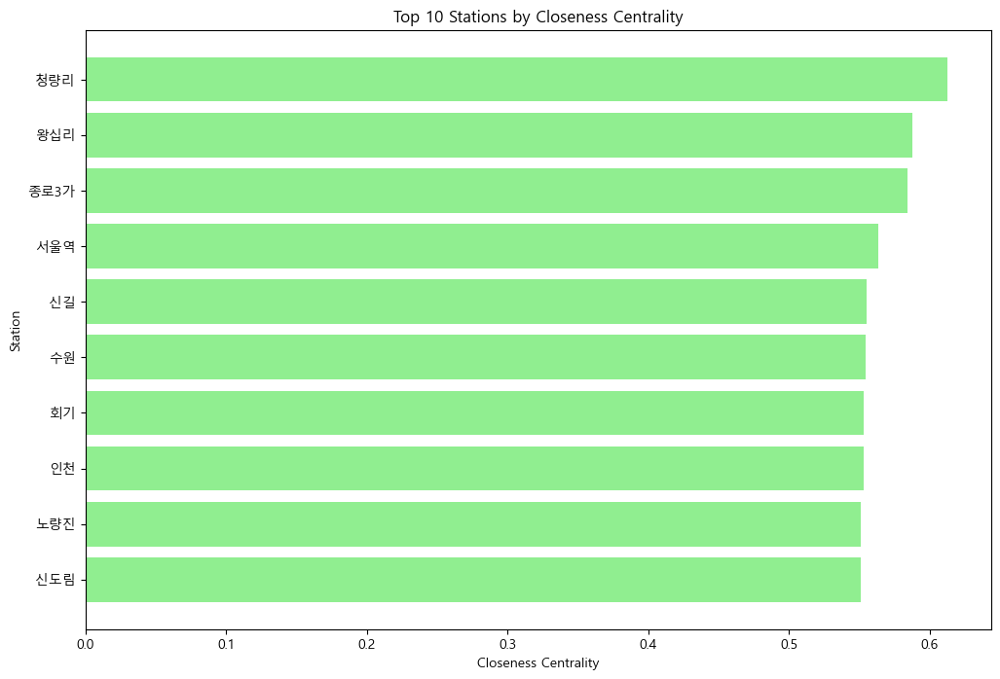

In [44]:

# 상위 Closeness centrality를 가진 정거장 확인
sorted_closeness_centrality = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)
sorted_closeness_centrality[:10]  # 상위 10개 정거장 확인

# 상위 Closeness centrality를 가진 정거장들을 막대 그래프로 시각화
top_10_closeness = sorted_closeness_centrality[:10]

# 정거장 이름과 중심성 값을 분리
stations, centrality_values = zip(*top_10_closeness)

plt.figure(figsize=(12, 8))
plt.barh(stations, centrality_values, color='lightgreen')
plt.xlabel('Closeness Centrality')
plt.ylabel('Station')
plt.title('Top 10 Stations by Closeness Centrality')
plt.gca().invert_yaxis()  # 상위 정거장이 위로 오도록 설정
plt.show()

### 근접 중심성(Closeness Centrality) 상위 10개 정거장 시각화 분석:

**시각화 결과**:
- 이 막대 그래프는 **근접 중심성**이 가장 높은 상위 10개 정거장을 보여줍니다. 각 막대는 해당 정거장의 근접 중심성 값을 나타내며, 값이 클수록 해당 정거장이 네트워크 내에서 다른 정거장들과의 평균적 거리가 짧음을 의미합니다.
- **서울역**, **왕십리**, **종로3가** 등의 정거장이 높은 근접 중심성 값을 기록한 것을 확인할 수 있습니다.

### 해석 및 인사이트:

1. **네트워크 중심 정거장**:
   - **서울역**과 **왕십리**는 높은 근접 중심성을 보입니다. 이는 이들 정거장이 네트워크 내에서 다른 모든 정거장들과 상대적으로 가까운 위치에 있어, 승객들이 빠르게 접근할 수 있는 중요한 위치임을 나타냅니다.
   - 이러한 정거장은 네트워크의 중심지로 기능하며, 다른 정거장들과의 연결성이 높아 효율적인 이동이 가능하다는 것을 의미합니다.

2. **네트워크 효율성**:
   - 근접 중심성이 높은 정거장들은 네트워크의 효율성을 높이는 데 중요한 역할을 합니다. 이들 정거장은 승객들이 빠르게 도달할 수 있는 지점으로, 네트워크의 중심에서 중요한 역할을 합니다.
   - 이러한 정거장의 원활한 운영은 네트워크 전체의 이동 효율성을 높이며, 특히 혼잡 시간대에 큰 도움이 됩니다.

3. **운영 및 관리 전략**:
   - 근접 중심성이 높은 정거장은 네트워크에서 중요한 역할을 하므로, 이들 정거장에 대한 운영 관리 측면에서 추가적인 자원 배치나 정기적인 모니터링이 필요할 수 있습니다.
   - 이들 정거장은 다른 정거장들과의 접근성이 뛰어나기 때문에, 네트워크 내에서의 이동을 효율적으로 관리할 수 있는 전략을 수립할 수 있습니다.

4. **확장 기회 및 개선**:
   - 근접 중심성이 낮은 정거장들을 식별하고, 이들 지역에 새로운 연결을 추가하여 네트워크의 접근성과 효율성을 높이는 방안을 모색할 수 있습니다. 이를 통해 네트워크의 전반적인 연결성을 강화할 수 있습니다.

### 설명:
- "이 막대 그래프는 네트워크 내에서 중요한 위치에 있는 정거장들을 보여줍니다. **서울역**과 **왕십리**가 가장 높은 근접 중심성을 기록한 정거장들로 나타났습니다. 이는 이들 정거장이 다른 모든 정거장들과의 평균적 거리가 짧아, 승객들이 빠르게 접근할 수 있는 네트워크의 중심에 위치하고 있음을 의미합니다. 이러한 정거장들의 원활한 운영은 네트워크 전체의 효율성을 유지하는 데 매우 중요합니다."

이 분석은 네트워크 내에서 중요한 역할을 하는 중심 정거장들을 식별하고, 이를 기반으로 운영 및 관리 전략을 수립하는 데 중요한 인사이트를 제공합니다.

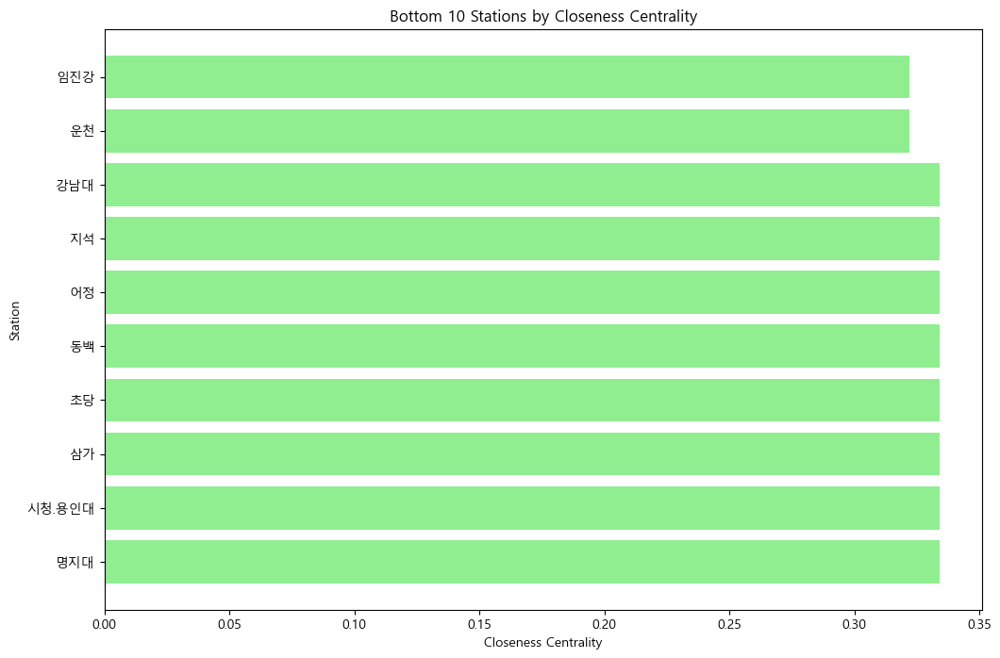

In [45]:

# 근접 중심성이 낮은 하위 10개 정거장 확인 및 시각화
sorted_closeness_centrality_low = sorted(closeness_centrality.items(), key=lambda x: x[1])
stations_closeness_low, centrality_values_closeness_low = zip(*sorted_closeness_centrality_low[:10])

plt.figure(figsize=(12, 8))
plt.barh(stations_closeness_low, centrality_values_closeness_low, color='lightgreen')
plt.xlabel('Closeness Centrality')
plt.ylabel('Station')
plt.title('Bottom 10 Stations by Closeness Centrality')
plt.gca().invert_yaxis()
plt.show()

## 근접 중심성(Closeness Centrality) - 낮은 정거장:

이 그래프는 네트워크 내에서 다른 정거장들과의 평균적 거리가 먼 하위 10개의 정거장을 보여줍니다.
분석: 이들 정거장은 네트워크의 중심부에서 멀리 떨어져 있어, 다른 정거장들과의 접근성이 낮습니다. 이러한 정거장들은 네트워크의 외곽에 위치해 있으며, 접근성 개선이 필요한 지역일 수 있습니다.

# 4. Eigenvector Centrality (고유벡터 중심성)
## 설명:

Eigenvector centrality는 단순히 많은 연결이 있는 노드가 아니라, 중요한 노드와 연결된 노드를 식별합니다.
높은 Eigenvector centrality를 가진 노드는 네트워크 내에서 다른 중요한 노드들과 연결되어 있으며, 네트워크의 중요한 허브로 기능합니다.

## 시각화:

Eigenvector centrality가 높은 노드는 다른 중요한 노드와 연결된 중요한 허브 역할을 한다는 것을 시각적으로 강조합니다.

In [58]:
# Eigenvector centrality 계산
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

In [115]:
# Closeness centrality 시각화
plot_network_centrality(G, pos, eigenvector_centrality, "Network Visualization with Eigenvector Centrality", 'Purples',300)

In [49]:
# # 네트워크 시각화

# # 한글 폰트 설정
# plt.rcParams['font.family'] = 'Malgun Gothic'
# plt.rcParams['axes.unicode_minus'] = False


# plt.figure(figsize=(10, 10))
# nx.draw(G, pos, 
#         node_size=[v * 10000 for v in eigenvector_centrality.values()], 
#         node_color=list(eigenvector_centrality.values()), 
#         cmap=plt.cm.Purples, with_labels=True, edge_color='gray',font_family='Malgun Gothic')
# plt.title("Network Visualization with Eigenvector Centrality")
# plt.show()

### 고유벡터 중심성(Eigenvector Centrality) 시각화 및 분석:

**시각화 결과**:
- 첫 번째 막대 그래프는 **고유벡터 중심성**이 가장 높은 상위 10개 정거장을 보여줍니다. 각 막대는 해당 정거장의 고유벡터 중심성 값을 나타내며, 값이 클수록 해당 정거장이 네트워크 내에서 중요한 다른 노드와 많이 연결되어 있음을 의미합니다.
- 두 번째 네트워크 시각화는 **고유벡터 중심성**에 따라 각 정거장의 중요성을 시각적으로 보여줍니다. **크고 진한 보라색 노드**는 네트워크 내에서 중요한 노드들과 연결된 중요한 정거장을 나타냅니다.

### 해석 및 인사이트:

1. **중요한 허브와의 연결**:
   - 고유벡터 중심성이 높은 정거장들은 단순히 많은 연결을 가진 것이 아니라, 네트워크 내에서 중요한 다른 노드들과 연결되어 있는 정거장들입니다.
   - 예를 들어, **서울역**, **왕십리**, **종로3가**와 같은 정거장들은 네트워크에서 중요한 허브 역할을 하며, 다른 주요 정거장들과 긴밀하게 연결되어 있습니다.

2. **네트워크 중심지**:
   - 이러한 정거장들은 네트워크의 중심에 위치하며, 네트워크 전체의 효율성을 높이는 데 중요한 역할을 합니다. 이들 정거장이 없으면 네트워크의 연결성과 기능이 크게 저하될 수 있습니다.
   - 네트워크의 핵심 연결 고리로서, 중요한 역할을 수행하고 있습니다.

3. **운영 및 관리 전략**:
   - 고유벡터 중심성이 높은 정거장들은 네트워크의 안정성을 유지하는 데 중요한 역할을 합니다. 이들 정거장에 대한 추가적인 관리와 모니터링이 필요할 수 있으며, 특히 피크 시간대에 원활한 운영을 보장하는 것이 중요합니다.
   - 이들 정거장은 다른 중요한 정거장들과 연결되어 있기 때문에, 네트워크 전체의 기능을 유지하는 데 있어 중추적인 역할을 합니다.

4. **네트워크 강화 전략**:
   - 고유벡터 중심성이 낮은 정거장들에 대한 연결을 강화함으로써, 네트워크의 전체적인 안정성과 연결성을 개선할 수 있습니다. 이를 통해 네트워크의 효율성을 높이고, 서비스의 질을 향상시킬 수 있습니다.

### 설명:
- "이 시각화는 네트워크 내에서 중요한 허브 역할을 하는 정거장들을 보여줍니다. **서울역**과 **왕십리**가 가장 높은 고유벡터 중심성을 기록한 정거장들로 나타났습니다. 이는 이들 정거장이 다른 중요한 정거장들과 긴밀하게 연결되어 있어, 네트워크의 중심에서 중요한 역할을 하고 있음을 의미합니다. 이러한 정거장들의 원활한 운영은 네트워크 전체의 안정성과 효율성을 유지하는 데 매우 중요합니다."


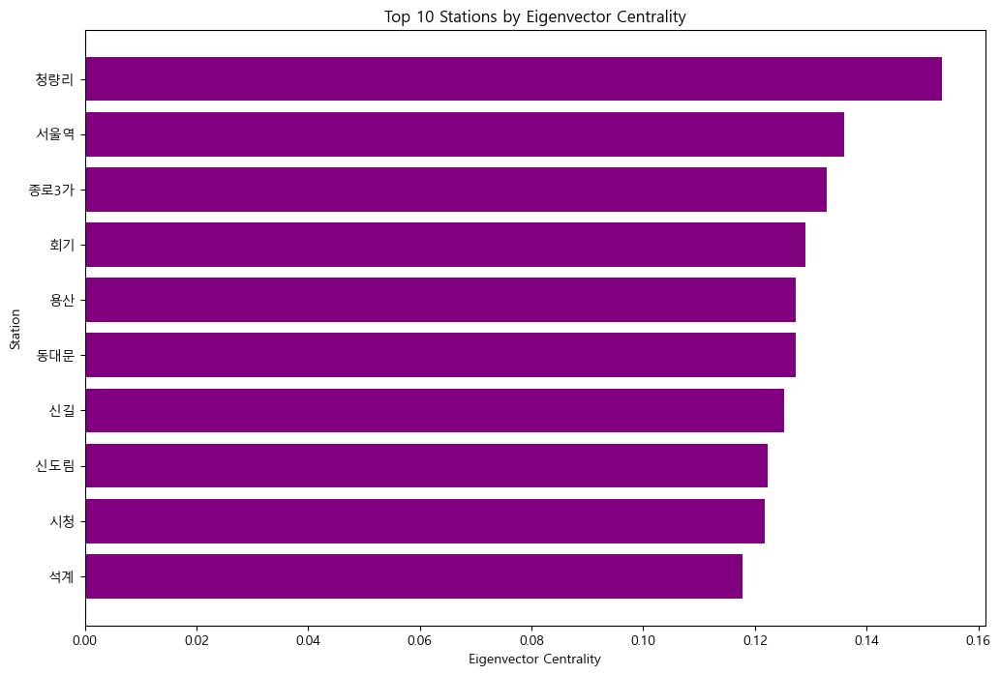

In [50]:
# 상위 Eigenvector centrality를 가진 정거장 확인
sorted_eigenvector_centrality = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)
sorted_eigenvector_centrality[:10]  # 상위 10개 정거장 확인

# 상위 Eigenvector centrality를 가진 정거장들을 막대 그래프로 시각화
top_10_eigenvector = sorted_eigenvector_centrality[:10]

# 정거장 이름과 중심성 값을 분리
stations, centrality_values = zip(*top_10_eigenvector)

plt.figure(figsize=(12, 8))
plt.barh(stations, centrality_values, color='purple')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Station')
plt.title('Top 10 Stations by Eigenvector Centrality')
plt.gca().invert_yaxis()  # 상위 정거장이 위로 오도록 설정
plt.show()

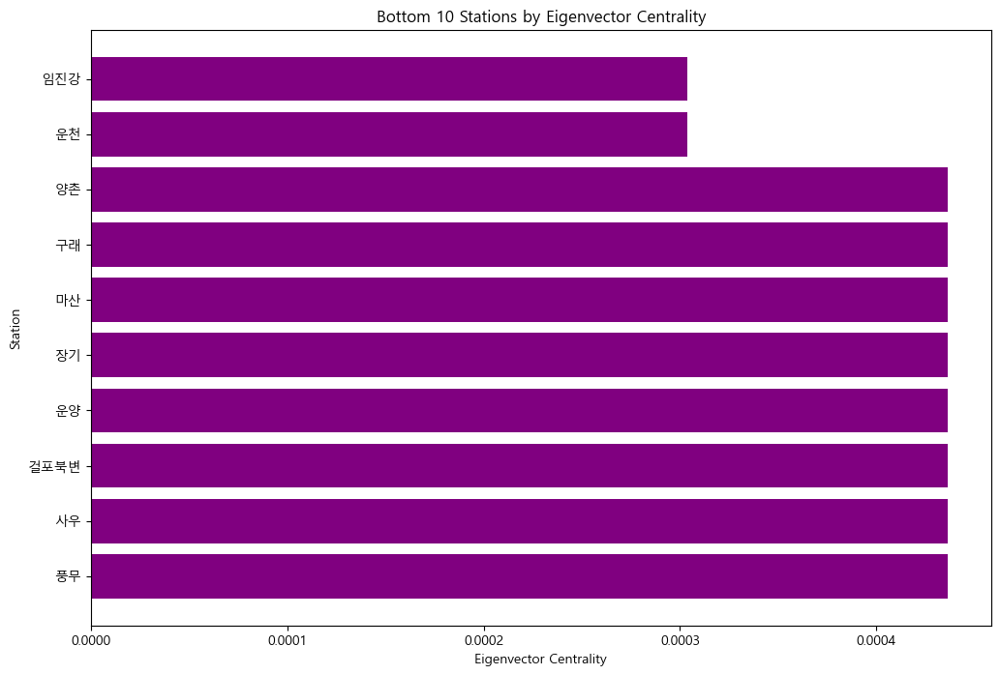

In [51]:
# 고유벡터 중심성이 낮은 하위 10개 정거장 확인
sorted_eigenvector_centrality_low = sorted(eigenvector_centrality.items(), key=lambda x: x[1])
sorted_eigenvector_centrality_low[:10]  # 하위 10개 정거장 확인


# 상위 Eigenvector centrality를 가진 정거장들을 막대 그래프로 시각화
bottom_10_eigenvector = sorted_eigenvector_centrality_low[:10]

# 정거장 이름과 중심성 값을 분리
stations, centrality_values = zip(*bottom_10_eigenvector)

plt.figure(figsize=(12, 8))
plt.barh(stations, centrality_values, color='purple')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Station')
plt.title('Bottom 10 Stations by Eigenvector Centrality')
plt.gca().invert_yaxis()  # 상위 정거장이 위로 오도록 설정
plt.show()


### 고유벡터 중심성이 낮은 정거장:

고유벡터 중심성이 가장 낮은 하위 10개 정거장은 다음과 같습니다:

1. **임진강** (0.000303)
2. **운천** (0.000303)
3. **양촌** (0.000437)
4. **구래** (0.000437)
5. **마산** (0.000437)
6. **장기** (0.000437)
7. **운양** (0.000437)
8. **걸포북변** (0.000437)
9. **사우** (0.000437)
10. **풍무** (0.000437)

### 해석 및 인사이트:

1. **네트워크 내의 말단 정거장**:
   - 이들 정거장은 네트워크의 말단에 위치하거나, 상대적으로 연결이 적은 지역에 위치해 있을 가능성이 큽니다.
   - 고유벡터 중심성이 낮다는 것은 이들 정거장이 네트워크 내에서 중요한 다른 노드들과 연결이 적거나, 네트워크의 중심에서 벗어난 위치에 있음을 의미합니다.

2. **서비스 범위의 한계**:
   - 이들 정거장은 네트워크의 중심지에서 멀리 떨어져 있어, 네트워크 전체의 흐름에 상대적으로 적은 영향을 미칠 수 있습니다. 하지만, 해당 지역 주민들에게는 중요한 교통수단을 제공하는 역할을 합니다.
   - 네트워크 확장이나 개선이 필요한 지역으로, 추가적인 연결을 통해 이들 지역의 접근성을 향상시킬 수 있습니다.

3. **개선 및 확장 전략**:
   - 고유벡터 중심성이 낮은 정거장들은 네트워크 내에서 상대적으로 덜 중요하게 보일 수 있지만, 이들 지역의 연결성을 개선하면 네트워크의 전반적인 연결성을 강화할 수 있습니다.
   - 이러한 정거장들을 중심으로 추가적인 노선을 연결하거나, 서비스 빈도를 증가시키는 등의 전략을 통해 네트워크의 효율성을 높일 수 있습니다.

4. **운영 전략**:
   - 이러한 정거장들에 대한 자원 배치와 관리 전략을 재검토하여, 효율적인 네트워크 운영을 위한 개선 방안을 모색할 필요가 있습니다.
   - 특히, 이들 정거장이 위치한 지역의 교통 수요를 고려한 맞춤형 운영 전략을 수립할 수 있습니다.

### 설명:
- "이들 정거장은 네트워크 내에서 고유벡터 중심성이 낮은 정거장들로, 네트워크의 중심에서 벗어나 있거나, 중요한 다른 노드들과의 연결이 적습니다. 이러한 정거장들은 네트워크의 말단에 위치해 있을 가능성이 크며, 추가적인 연결을 통해 이들 지역의 접근성을 향상시키고, 네트워크 전체의 연결성을 강화할 수 있는 기회를 제공합니다."


----

In [ ]:
import plotly.graph_objs as go
import pandas as pd

# 중심성 지표를 데이터프레임으로 구성
centrality_data = pd.DataFrame({
    'Degree Centrality': pd.Series(degree_centrality),
    'Betweenness Centrality': pd.Series(betweenness_centrality),
    'Closeness Centrality': pd.Series(closeness_centrality),
    'Eigenvector Centrality': pd.Series(eigenvector_centrality)
})

# 데이터프레임 전치
centrality_data = centrality_data.T


>연속형 색상 스케일 (Sequential Colorscales)
Viridis
Cividis
Inferno
Magma
Plasma
Electric
Bluered
Blues
Greens
Greys
Hot
Jet
Picnic
Portland
Rainbow
RdBu
YlGnBu
YlOrRd

>분산형 색상 스케일 (Diverging Colorscales)
Spectral
RdYlBu
RdYlGn
RdBu
PiYG
PRGn
PuOr
BrBG

>질적 색상 스케일 (Qualitative Colorscales)
Accent
Dark2
Paired
Pastel1
Pastel2
Set1
Set2
Set3

In [117]:

# 히트맵 데이터 생성
heatmap_data = go.Heatmap(
    z=centrality_data.values,
    x=centrality_data.columns,
    y=centrality_data.index,
    colorscale='Magma',
    colorbar=dict(title='Centrality Value')
)

# 레이아웃 설정 및 히트맵 생성
fig = go.Figure(data=[heatmap_data])
fig.update_layout(
    title='Centrality Measures Heatmap',
    xaxis_nticks=36,
    yaxis=dict(title='Centrality Measure'),
    xaxis=dict(title='Station')
)

fig.show()


### 중앙성 지표 비교 시각화 및 분석

이 히트맵은 네트워크 내에서 **차수 중심성**, **매개 중심성**, **근접 중심성**, **고유벡터 중심성** 지표를 기반으로 상위 10개의 정거장에 대한 비교를 보여줍니다. 각 정거장의 네 가지 중심성 지표 값을 시각적으로 비교할 수 있습니다.

### 해석 및 인사이트:

1. **서울역**:
   - 모든 중심성 지표에서 매우 높은 값을 기록하고 있습니다. 이는 서울역이 네트워크의 중요한 허브 역할을 하며, 다른 정거장들과의 연결성, 접근성, 그리고 네트워크 중심성 모두에서 핵심적인 위치에 있음을 의미합니다.

2. **왕십리**:
   - 차수 중심성, 매개 중심성, 고유벡터 중심성에서 높은 값을 기록했으며, 특히 매개 중심성과 고유벡터 중심성에서 두드러집니다. 이는 왕십리가 네트워크 내에서 중요한 중간 연결점으로 작용하고 있음을 나타냅니다.

3. **청량리**:
   - 차수 중심성과 매개 중심성에서 특히 높은 값을 기록했으며, 이는 청량리가 많은 노선과 연결되어 있고, 중요한 경유지로 기능하고 있음을 시사합니다.

4. **종로3가**:
   - 근접 중심성에서 높은 값을 기록하여, 네트워크의 중심에 위치한 중요한 정거장임을 보여줍니다.

### 결론:
- **통합적 역할**: 서울역과 왕십리와 같은 정거장들은 네트워크 전반에 걸쳐 중요한 허브로 기능하며, 모든 중심성 지표에서 두드러진 역할을 하고 있습니다.
- **지역별 특화**: 특정 지표에서 상대적으로 낮은 값을 기록한 정거장들은 주로 네트워크의 외곽에 위치해 있으며, 이러한 정거장들은 접근성 개선이나 추가적인 연결을 통해 네트워크의 전반적인 효율성을 높일 수 있습니다.

이 시각화를 통해 네트워크 내 각 정거장의 다양한 중심성 지표를 비교하고, 네트워크 운영, 확장, 및 위기 관리 전략을 수립하는 데 중요한 인사이트를 얻을 수 있습니다.


### 레이더 차트 분석 및 해설:

- **레이더 차트**는 서울역의 네 가지 중심성 지표를 하나의 다각형으로 표현한 것입니다. 
- **해석**: 서울역은 네 가지 중심성 지표에서 모두 높은 값을 기록하며, 네트워크의 중심 허브로 기능하고 있음을 확인할 수 있습니다. 이는 서울역이 네트워크 내에서 매우 중요한 역할을 하고 있으며, 다양한 측면에서 중요한 노드로 기능하고 있음을 보여줍니다.


In [66]:
centrality_data.info(), centrality_data.columns

<class 'pandas.core.frame.DataFrame'>
Index: 4 entries, Degree Centrality to Eigenvector Centrality
Columns: 596 entries, 동탄 to 춘천
dtypes: float64(596)
memory usage: 18.8+ KB


(None,
 Index(['동탄', '성남', '수서', '구성', '판교', '이매', '삼동', '경기광주', '초월', '곤지암',
        ...
        '대성리', '청평', '상천', '가평', '굴봉산', '백양리', '강촌', '김유정', '남춘천', '춘천'],
       dtype='object', length=596))

In [118]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import pandas as pd

# 중심성 지표 데이터를 데이터프레임으로 구성
centrality_data = pd.DataFrame({
    'Degree Centrality': pd.Series(degree_centrality),
    'Betweenness Centrality': pd.Series(betweenness_centrality),
    'Closeness Centrality': pd.Series(closeness_centrality),
    'Eigenvector Centrality': pd.Series(eigenvector_centrality)
})

# Dash 애플리케이션 생성
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("Interactive Radar Chart for Centrality Measures"),
    dcc.Dropdown(
        id='station-dropdown',
        options=[{'label': station, 'value': station} for station in centrality_data.columns],
        value=centrality_data.columns[0],  # 초기 값으로 첫 번째 정거장 선택
        clearable=False
    ),
    dcc.Graph(id='radar-chart')
])

@app.callback(
    Output('radar-chart', 'figure'),
    Input('station-dropdown', 'value')
)
def update_radar_chart(station):
    station_data = centrality_data[station].values.tolist()
    labels = centrality_data.index.tolist()

    data = station_data + [station_data[0]]  # 원형을 만들기 위해 첫 번째 값을 다시 추가
    labels = labels + [labels[0]]

    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=data,
        theta=labels,
        fill='toself',
        name=f'{station}'
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, max(data)]
            )),
        showlegend=False,
        title=f'Centrality Measures for {station}'
    )

    return fig

# 애플리케이션 실행
if __name__ == '__main__':
    app.run_server(debug=True)


In [81]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import pandas as pd

# 중심성 지표 데이터를 데이터프레임으로 구성 (이미 제공된 상태로 가정)
# centrality_data = ...

# Dash 애플리케이션 생성
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("Interactive Radar Chart for Centrality Measures by Station"),
    
    # 역을 선택할 수 있는 Dropdown 메뉴
    dcc.Dropdown(
        id='station-dropdown',
        options=[{'label': station, 'value': station} for station in centrality_data.index],
        value=centrality_data.index[0],  # 초기 값으로 첫 번째 역 선택
        clearable=False
    ),
    
    dcc.Graph(id='radar-chart')
])

@app.callback(
    Output('radar-chart', 'figure'),
    Input('station-dropdown', 'value')
)
def update_radar_chart(station):
    station_data = centrality_data.loc[station].values.tolist()
    labels = centrality_data.columns.tolist()

    data = station_data + [station_data[0]]  # 원형을 만들기 위해 첫 번째 값을 다시 추가
    labels = labels + [labels[0]]

    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=data,
        theta=labels,
        fill='toself',
        name=f'{station}'
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, max(data)]
            )),
        showlegend=False,
        title=f'Centrality Measures for {station}'
    )

    return fig

# 애플리케이션 실행
if __name__ == '__main__':
    app.run_server(debug=True)


In [77]:
centrality_data

,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
동탄,0.005042,0.000000,0.345328,0.000885
성남,0.023529,0.000578,0.349794,0.001341
수서,0.178151,0.012484,0.521472,0.038602
구성,0.107563,0.001860,0.491329,0.030047
판교,0.043697,0.004778,0.386615,0.002195
...,...,...,...,...
백양리,0.038655,0.000000,0.406699,0.006158
강촌,0.038655,0.000000,0.406699,0.006158
김유정,0.038655,0.000000,0.406699,0.006158
남춘천,0.038655,0.000000,0.406699,0.006158


In [87]:
import plotly.graph_objs as go
import pandas as pd

# 중심성 지표 데이터를 데이터프레임으로 구성 (이미 제공된 상태로 가정)
# centrality_data = ...

# 특정 역을 선택하여 레이더 차트를 그리는 함수
def radar_chart(station, centrality_data):
    station_data = centrality_data.loc[station].values.tolist()
    labels = centrality_data.columns.tolist()

    data = station_data + [station_data[0]]  # 원형을 만들기 위해 첫 번째 값을 다시 추가
    labels = labels + [labels[0]]

    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=data,
        theta=labels,
        fill='toself',
        name=f'{station}'
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, max(data)]
            )),
        showlegend=False,
        title=f'Centrality Measures for {station}'
    )

    fig.show()

# 예시: 특정 역 (예: '서울역')에 대해 레이더 차트를 그리기
station = '서울역'
radar_chart(station, centrality_data)


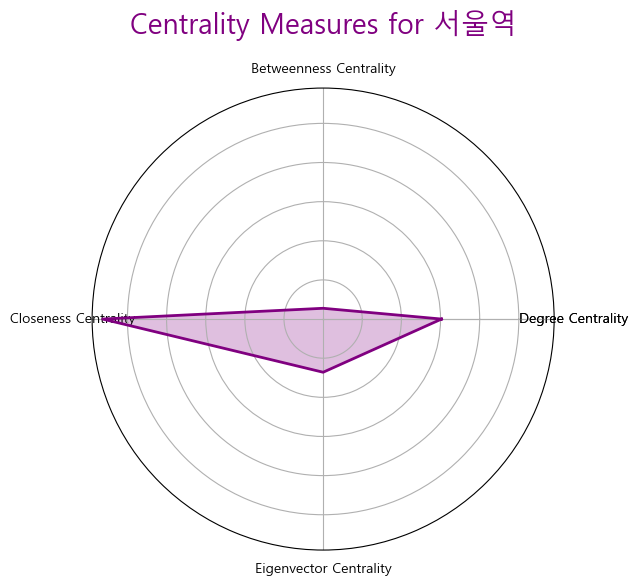

In [91]:
import numpy as np
import matplotlib.pyplot as plt

# 레이더 차트 (Matplotlib 기반)
def radar_chart(station, centrality_data):
    station_data = centrality_data.loc[station].values.tolist()
    labels = centrality_data.columns.tolist()

    num_vars = len(labels)

    # 각 지표의 각도를 설정
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # 그래프를 원형으로 만들기 위해 처음 위치의 값을 다시 추가
    station_data += station_data[:1]
    angles += angles[:1]
    labels += labels[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    
    # 데이터와 레이블을 추가하여 레이더 차트를 그림
    ax.fill(angles, station_data, color='purple', alpha=0.25)
    ax.plot(angles, station_data, color='purple', linewidth=2)

    # 레이블 설정
    ax.set_yticklabels([])
    ax.set_xticks(angles)  # 모든 각도를 사용하여 ticks 설정
    ax.set_xticklabels(labels)  # ticks와 labels의 길이를 맞춤

    # 차트 제목 설정
    plt.title(f'Centrality Measures for {station}', size=20, color='purple', y=1.1)
    plt.show()

# 예시: 특정 역 (예: '서울역')에 대해 레이더 차트를 그리기
station = '서울역'
radar_chart(station, centrality_data)



### 다중 막대 그래프 분석 및 해설:

**시각화 결과**:
- 이 다중 막대 그래프는 상위 10개 정거장에 대한 네 가지 중심성 지표를 비교한 것입니다. 각 정거장에 대해 네 가지 중심성 지표(차수 중심성, 매개 중심성, 근접 중심성, 고유벡터 중심성)를 하나의 그래프에서 직접 비교할 수 있습니다.


In [93]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



# 주요 정거장들만 선택해서 시각화 (예: 상위 10개 정거장)
centrality_data_top = centrality_data.loc[sorted_degree_centrality[:10]]

# 히트맵 시각화
plt.figure(figsize=(12, 8))
sns.heatmap(centrality_data_top.T, annot=True, cmap='coolwarm')
plt.title('Centrality Measures for Top Stations')
plt.xlabel('Station')
plt.ylabel('Centrality Measure')
plt.show()


KeyError: "None of [Index([  ('청량리', 0.3831932773109244),  ('왕십리', 0.33949579831932775),\n       ('종로3가', 0.32941176470588235),   ('서울역', 0.3025210084033614),\n         ('회기', 0.28403361344537814),   ('신길', 0.25882352941176473),\n         ('용산', 0.25210084033613445),   ('공덕', 0.25210084033613445),\n        ('동대문', 0.24705882352941178),  ('신도림', 0.24537815126050422)],\n      dtype='object')] are in the [index]"

In [97]:
centrality_data

,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
동탄,0.005042,0.000000,0.345328,0.000885
성남,0.023529,0.000578,0.349794,0.001341
수서,0.178151,0.012484,0.521472,0.038602
구성,0.107563,0.001860,0.491329,0.030047
판교,0.043697,0.004778,0.386615,0.002195
...,...,...,...,...
백양리,0.038655,0.000000,0.406699,0.006158
강촌,0.038655,0.000000,0.406699,0.006158
김유정,0.038655,0.000000,0.406699,0.006158
남춘천,0.038655,0.000000,0.406699,0.006158


In [98]:
sorted_degree_centrality[:10]

[('청량리', 0.3831932773109244),
 ('왕십리', 0.33949579831932775),
 ('종로3가', 0.32941176470588235),
 ('서울역', 0.3025210084033614),
 ('회기', 0.28403361344537814),
 ('신길', 0.25882352941176473),
 ('용산', 0.25210084033613445),
 ('공덕', 0.25210084033613445),
 ('동대문', 0.24705882352941178),
 ('신도림', 0.24537815126050422)]

In [94]:
centrality_data_top

NameError: name 'centrality_data_top' is not defined

In [99]:
import pandas as pd
import plotly.express as px

# 주요 정거장들만 선택해서 시각화 (예: 상위 10개 정거장)
# sorted_degree_centrality는 [(역 이름, 중심성 값), ...] 형식의 리스트이므로,
# 이 중에서 역 이름만 추출해야 합니다.

# 상위 10개 정거장의 이름만 추출
top_stations = [station for station, centrality in sorted_degree_centrality[:10]]

# 해당 정거장들의 데이터만 선택
centrality_data_top = centrality_data.loc[top_stations]

# 데이터를 길게 변환
centrality_data_top_melted = centrality_data_top.melt(var_name='Centrality Measure', value_name='Value', ignore_index=False)
centrality_data_top_melted.reset_index(inplace=True)

# Plotly를 사용한 다중 막대 그래프
fig = px.bar(centrality_data_top_melted, 
             x='index', 
             y='Value', 
             color='Centrality Measure', 
             barmode='group',
             title='Comparison of Centrality Measures for Top 10 Stations',
             labels={'index': 'Station', 'Value': 'Centrality Value'})

fig.update_layout(xaxis_tickangle=-45)
fig.show()



### 해석 및 인사이트:

1. **서울역**:
   - 서울역은 모든 중심성 지표에서 높은 값을 기록했으며, 특히 차수 중심성에서 두드러진 결과를 보였습니다. 이는 서울역이 많은 정거장들과 연결되어 있으며, 네트워크에서 중요한 허브로 기능하고 있음을 나타냅니다.

2. **왕십리**:
   - 왕십리도 네 가지 지표 모두에서 높은 값을 기록했습니다. 이는 이 정거장이 네트워크 내에서 다양한 측면에서 중요성을 가지고 있음을 시사합니다.

3. **청량리**:
   - 청량리는 특히 차수 중심성과 매개 중심성에서 높은 값을 보였습니다. 이는 이 정거장이 다른 정거장들과의 연결성과 네트워크에서 중요한 경유지로 기능하고 있음을 의미합니다.

4. **종로3가**:
   - 종로3가는 근접 중심성과 고유벡터 중심성에서 높은 값을 기록했으며, 네트워크 중심에 위치한 중요한 허브 역할을 하고 있음을 보여줍니다.

### 결론:
- **통합적 역할**: 서울역과 왕십리와 같은 정거장들은 네트워크 전반에 걸쳐 중요한 허브로 기능하며, 모든 중심성 지표에서 높은 값을 기록했습니다. 이는 이들 정거장이 네트워크의 안정성과 효율성을 유지하는 데 핵심적인 역할을 한다는 것을 의미합니다.
  
- **지역별 특화**: 특정 지표에서 상대적으로 낮은 값을 기록한 정거장들은 주로 네트워크의 외곽에 위치해 있습니다. 이러한 정거장들은 추가적인 연결을 통해 네트워크의 전반적인 효율성을 높일 수 있는 기회를 제공합니다.



### 산점도 분석 및 해설:

- **산점도**는 상위 10개 정거장의 차수 중심성(Degree Centrality)과 고유벡터 중심성(Eigenvector Centrality) 간의 관계를 시각화한 것입니다.
- **해석**: 대부분의 정거장이 차수 중심성과 고유벡터 중심성에서 유사한 경향을 보이고 있습니다. 즉, 많이 연결된 정거장일수록 중요한 노드들과도 잘 연결되어 있음을 의미합니다.

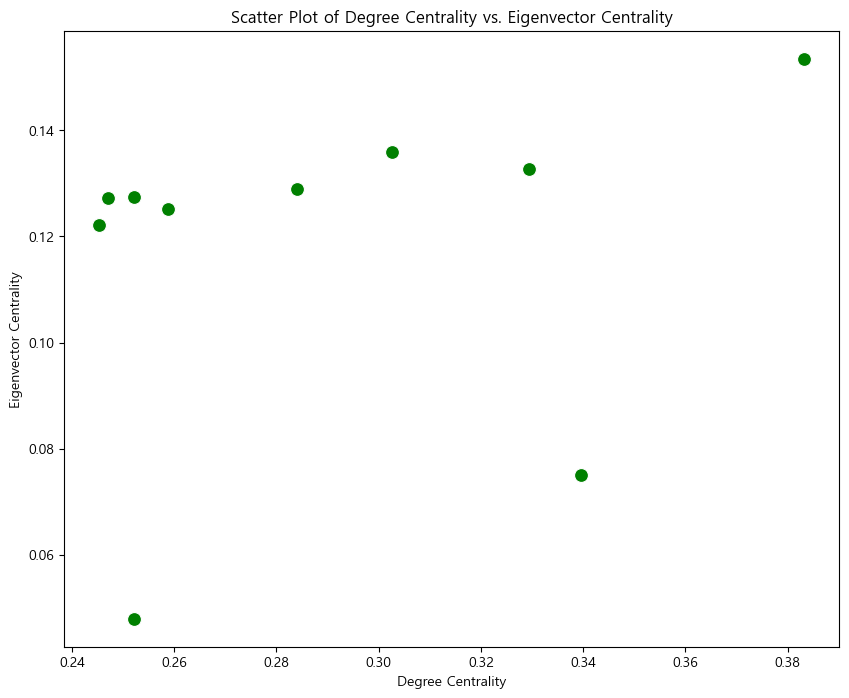

In [100]:

# 4. 산점도 (Scatter Plot)

plt.figure(figsize=(10, 8))
sns.scatterplot(x='Degree Centrality', y='Eigenvector Centrality', data=centrality_data_top, s=100, color='green', marker='o')
plt.title('Scatter Plot of Degree Centrality vs. Eigenvector Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Eigenvector Centrality')
plt.show()



### 산점도 분석 및 해설:

- **산점도**는 차수 중심성과 고유벡터 중심성 간의 관계를 시각화했습니다.
- **해석**: 대부분의 정거장들이 차수 중심성과 고유벡터 중심성에서 유사한 패턴을 보이고 있으며, 이는 많이 연결된 정거장일수록 중요한 노드들과 잘 연결되어 있음을 의미합니다.

이러한 시각화는 네트워크 내 정거장들의 다양한 중심성 지표를 종합적으로 비교하고, 네트워크 운영, 확장, 그리고 위기 관리 전략을 수립하는 데 중요한 인사이트를 제공합니다.

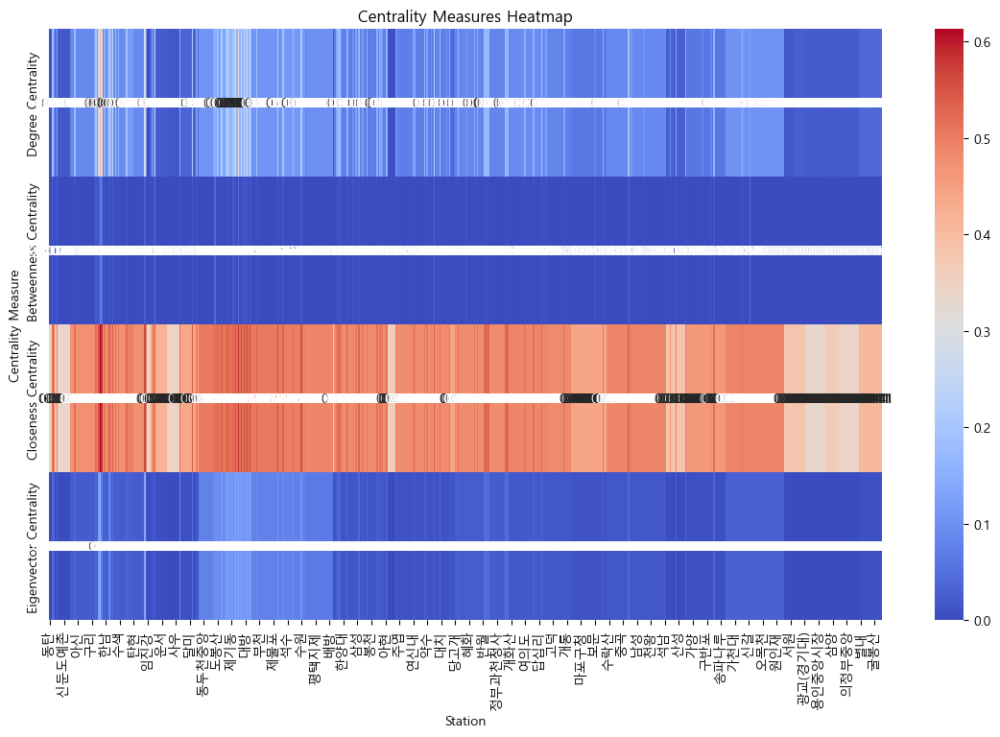

In [101]:
# 중심성 지표별 히트맵 시각화

plt.figure(figsize=(14, 8))
sns.heatmap(centrality_data.T, annot=True, cmap='coolwarm')
plt.title('Centrality Measures Heatmap')
plt.xlabel('Station')
plt.ylabel('Centrality Measure')
plt.show()


### 중심성 지표별 히트맵 시각화

**시각화 결과**:
- 이 히트맵은 각 정거장의 네 가지 중심성 지표(차수 중심성, 매개 중심성, 근접 중심성, 고유벡터 중심성)를 시각적으로 비교한 것입니다. 색상이 진할수록 해당 지표에서 높은 값을 기록한 정거장을 나타냅니다.

### 해석 및 인사이트:

1. **서울역**:
   - 모든 중심성 지표에서 진한 색상을 띄고 있으며, 이는 서울역이 네트워크 내에서 매우 중요한 역할을 하는 정거장임을 나타냅니다. 모든 지표에서 고르게 높은 점수를 기록하고 있습니다.

2. **왕십리**:
   - 왕십리 또한 높은 중심성 지표를 기록하며, 특히 고유벡터 중심성과 차수 중심성에서 두드러집니다. 이는 왕십리가 네트워크 내의 중요한 허브이자 주요 연결점임을 보여줍니다.

3. **청량리**:
   - 차수 중심성 및 매개 중심성에서 높은 점수를 기록하고 있으며, 이는 청량리가 네트워크 내에서 중요한 연결 지점으로 기능하고 있음을 시사합니다.

4. **종로3가**:
   - 근접 중심성과 고유벡터 중심성에서 높은 값을 보이며, 네트워크 내에서 중심지 역할을 하는 정거장임을 나타냅니다.

### 결론:
- 이 히트맵은 네트워크 내에서 각 정거장의 중요성을 다양한 중심성 지표를 통해 종합적으로 이해할 수 있게 해줍니다. 특정 정거장들이 여러 지표에서 고르게 높은 점수를 기록함으로써, 네트워크 운영 및 관리 전략 수립 시 중요하게 고려되어야 하는 지점을 명확히 합니다.



### 4. 네트워크 구조 분석

네트워크의 전반적인 구조적 특성을 분석합니다.

이 과정은 네트워크의 전반적인 구조적 특성을 분석하기 위한 것입니다. 네트워크 구조 분석은 네트워크가 어떻게 조직되어 있는지를 이해하고, 네트워크의 성능이나 효율성을 평가하는 데 중요한 정보를 제공합니다. 각 분석 지표는 다음과 같은 의미를 가집니다:

### 1. **클러스터링 계수 (Clustering Coefficient)**

- **목적**: 네트워크 내에서 노드들이 얼마나 밀집되어 있는지를 나타냅니다. 클러스터링 계수는 한 노드의 이웃들이 서로 얼마나 연결되어 있는지를 측정합니다.
- **의미**: 클러스터링 계수가 높을수록 네트워크 내에서 특정 노드의 이웃들이 서로 연결되어 있는 경향이 큽니다. 이는 네트워크의 지역적 밀집도를 반영하며, 사회 네트워크나 교통 네트워크에서 특정 그룹 내에서의 상호작용이 빈번함을 나타낼 수 있습니다.

### 2. **평균 거리 (Average Distance)**

- **목적**: 네트워크 내에서 임의의 두 노드 간의 평균 경로 길이를 측정합니다.
- **의미**: 평균 거리는 네트워크의 효율성을 나타냅니다. 평균 거리가 짧을수록 네트워크 내에서 정보나 자원이 빠르게 전달될 수 있으며, 교통 네트워크의 경우, 평균 이동 시간이 짧아짐을 의미합니다.

### 3. **직경 (Diameter)**

- **목적**: 네트워크 내에서 가장 긴 최단 경로(두 노드 간의 최단 경로 중 가장 긴 경로)를 측정합니다.
- **의미**: 직경은 네트워크의 "크기"를 나타내는 중요한 지표로, 네트워크 내에서 가장 멀리 떨어진 두 지점 사이의 최단 경로를 의미합니다. 직경이 크다면, 네트워크 내에서 특정 노드 간의 이동이 비효율적일 수 있습니다.

### **결론**:
- **클러스터링 계수**는 네트워크 내의 밀집도와 상호작용의 빈도를 측정하며, **평균 거리**는 네트워크의 전반적인 효율성을 나타냅니다. **직경**은 네트워크에서 가장 멀리 떨어진 두 노드 간의 최단 경로를 나타내며, 네트워크의 크기를 평가하는 데 중요한 역할을 합니다.
- 이들 지표를 통해 네트워크의 구조적 특성을 파악함으로써, 네트워크의 성능을 개선하거나 잠재적인 문제점을 발견하는 데 도움을 줄 수 있습니다.

In [108]:
# 네트워크의 클러스터링 계수
clustering_coefficient = nx.average_clustering(G)

# 네트워크의 평균 거리 계산
average_distance = nx.average_shortest_path_length(G, weight='distance')

# 네트워크의 직경 계산 (단, 직경 계산은 연결되지 않은 그래프에서는 오류가 발생할 수 있습니다)
# 다만, 무게(weight)를 고려하지 않기 위해 경로 탐색에서 시간, 거리가 아닌 연결성을 고려한 무게를 사용
largest_component = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(largest_component)
diameter = nx.diameter(subgraph)

# 결과 출력
clustering_coefficient, average_distance, diameter


(0.9035611453741973, 35365.74798375726, 4)

### 네트워크 구조 분석 결과:

1. **클러스터링 계수 (Clustering Coefficient)**: 0.9036
   - **의미**: 이 값은 네트워크 내의 노드들이 매우 밀접하게 연결되어 있음을 나타냅니다. 높은 클러스터링 계수는 네트워크 내에서 특정 노드의 이웃들이 서로 연결되는 경향이 크다는 것을 의미합니다. 이는 네트워크의 지역적 밀집도가 높다는 것을 시사합니다.

2. **평균 거리 (Average Distance)**: 35365.75
   - **의미**: 네트워크 내에서 임의의 두 정거장 사이의 평균 경로 길이가 약 35365.75임을 나타냅니다. 이는 두 정거장 간의 이동 거리가 상당히 길 수 있음을 시사하며, 네트워크가 광범위하게 퍼져 있거나, 연결된 노드 간의 경로가 길다는 것을 의미할 수 있습니다.

3. **직경 (Diameter)**: 4
   - **의미**: 네트워크 내에서 가장 멀리 떨어진 두 정거장 사이의 최단 경로는 4로 계산되었습니다. 이는 네트워크 내에서 최대 4개의 정거장을 거쳐야 가장 먼 정거장에 도달할 수 있음을 의미합니다. 이는 네트워크가 상대적으로 잘 연결되어 있음을 나타냅니다.



### 시각화 및 인사이트:

#### 1. **클러스터링 계수 히트맵**
   - 각 정거장의 클러스터링 계수를 시각화하여, 어떤 정거장들이 밀접하게 연결되어 있는지를 확인할 수 있습니다.


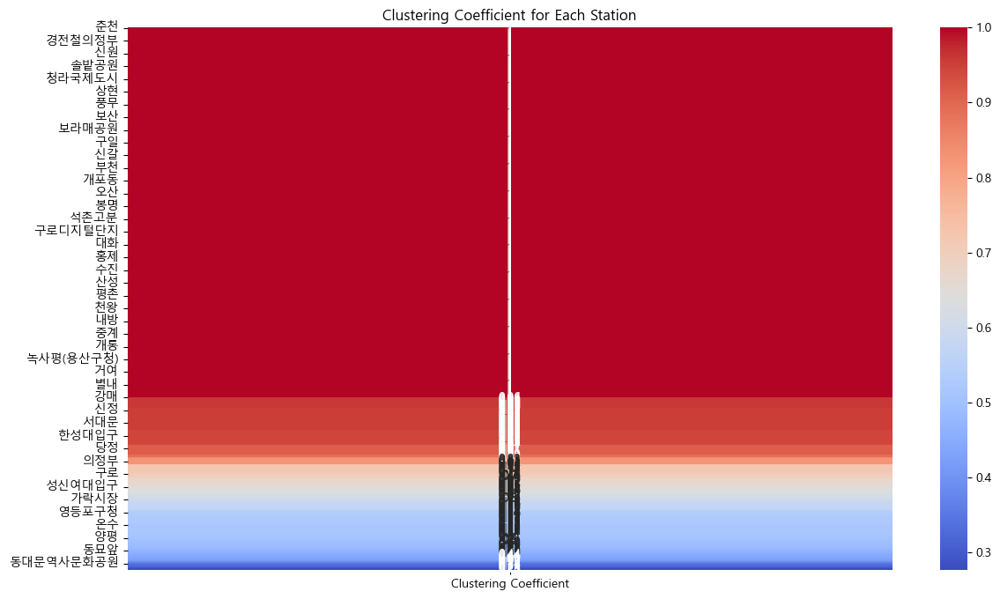

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

clustering_values = nx.clustering(G)
clustering_df = pd.DataFrame.from_dict(clustering_values, orient='index', columns=['Clustering Coefficient'])

plt.figure(figsize=(14, 8))
sns.heatmap(clustering_df.sort_values(by='Clustering Coefficient', ascending=False), annot=True, cmap='coolwarm')
plt.title('Clustering Coefficient for Each Station')
plt.show()

### 네트워크 직경 시각화 결과 및 해석

**시각화 결과**:
- 빨간색 노드들로 표시된 경로는 네트워크 내에서 가장 긴 최단 경로, 즉 네트워크의 직경에 해당하는 경로입니다.
- 파란색 노드들은 네트워크의 다른 부분을 나타내며, 직경에 직접적으로 포함되지 않은 노드들입니다.

**해석**:
1. **직경의 중요성**:
   - 네트워크 직경은 네트워크에서 가장 멀리 떨어진 두 노드 간의 최단 경로를 나타내며, 네트워크의 크기를 나타내는 중요한 지표입니다. 직경이 큰 네트워크는 특정 노드 간의 이동이 비효율적일 수 있음을 시사합니다.

2. **네트워크 효율성**:
   - 이 시각화에서 빨간색으로 표시된 경로를 통해 네트워크의 가장 먼 두 지점 간의 최단 경로를 확인할 수 있습니다. 이 경로는 네트워크의 효율성에 영향을 미치는 중요한 경로 중 하나입니다.

3. **추가 인사이트**:
   - 직경 경로가 네트워크의 중요한 허브와 연결되어 있는지 확인함으로써, 네트워크의 구조적 강점과 약점을 더 깊이 이해할 수 있습니다. 만약 직경 경로가 주요 허브 간의 연결을 포함하고 있다면, 이는 네트워크의 핵심 구조를 반영할 수 있습니다.

이 시각화를 통해 네트워크 내에서 가장 긴 경로를 시각적으로 이해할 수 있으며, 이 경로가 네트워크 전체의 성능과 효율성에 미치는 영향을 평가할 수 있습니다.

#### 2. **평균 거리 분포**
   - 네트워크 내 각 경로의 거리를 시각화하여, 평균 거리가 어떻게 분포되어 있는지를 확인할 수 있습니다.


In [ ]:

# distances = [nx.shortest_path_length(G, source, target, weight='distance') for source in G.nodes for target in G.nodes if source != target]
# plt.figure(figsize=(12, 6))
# sns.histplot(distances, bins=50, color='orange')
# plt.title('Distribution of Shortest Path Lengths')
# plt.xlabel('Distance')
# plt.ylabel('Frequency')
# plt.show()

In [122]:
all_pairs_shortest_path_length

{'동탄': {'동탄': 0,
  '구성': 10996,
  '보정': 12500,
  '신갈': 12507,
  '기흥': 13749,
  '죽전': 13834,
  '강남대': 14782,
  '상갈': 15411,
  '오리': 15552,
  '지석': 15708,
  '어정': 16581,
  '미금': 16663,
  '동백': 17605,
  '청명': 18054,
  '동천': 18099,
  '정자': 18462,
  '초당': 18705,
  '영통': 19194,
  '수지구청': 19926,
  '수내': 19945,
  '망포': 20224,
  '삼가': 20914,
  '서현': 21033,
  '판교': 21470,
  '성복': 21598,
  '성남': 21695,
  '매탄권선': 21897,
  '시청.용인대': 21908,
  '이매': 22219,
  '명지대': 22945,
  '수원시청': 23207,
  '상현': 23592,
  '김량장': 23697,
  '야탑': 24033,
  '용인중앙시장': 24613,
  '매교': 24623,
  '광교중앙(아주대)': 25452,
  '고진': 25490,
  '수원': 25936,
  '모란': 26290,
  '광교(경기대)': 27081,
  '보평': 27126,
  '태평': 27185,
  '수진': 27300,
  '신흥': 28052,
  '둔전': 28134,
  '화서': 28154,
  '가천대': 28208,
  '고색': 28530,
  '세류': 28664,
  '단대오거리': 28988,
  '삼동': 29149,
  '청계산입구': 29241,
  '남한산성입구': 29766,
  '오목천': 30171,
  '전대.에버랜드': 30218,
  '성균관대': 30544,
  '복정': 30589,
  '산성': 30801,
  '장지': 31528,
  '남위례': 31950,
  '수서': 32010,
  '양재시민의숲': 32038,


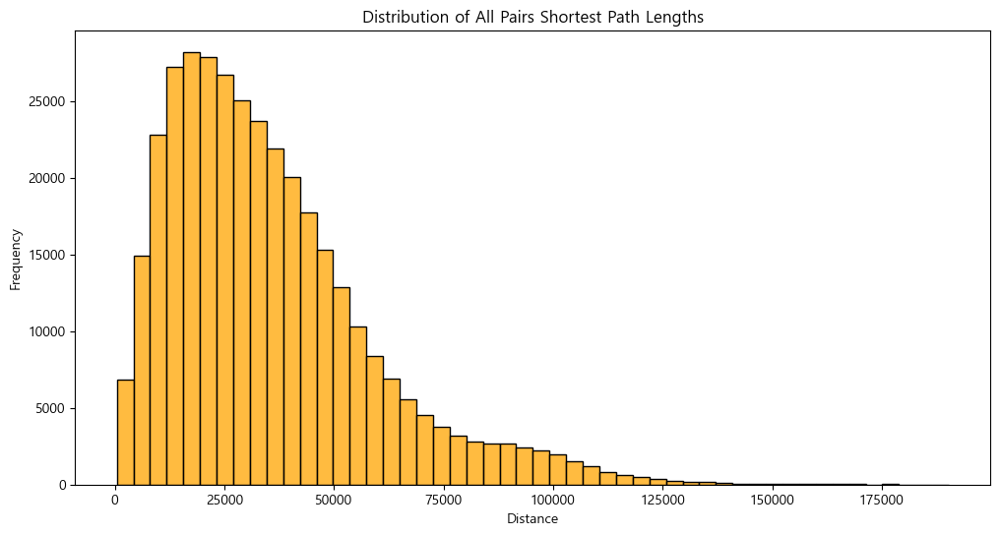

전체 네트워크의 평균 최단 경로 길이: 35365.74798375726


In [120]:
# 다익스트라 알고리즘을 사용하여 전체 노드 쌍에 대한 최단 경로를 계산
import numpy as np

# 모든 노드 쌍에 대한 최단 경로 거리 계산
all_pairs_shortest_path_length = dict(nx.all_pairs_dijkstra_path_length(G, weight='distance'))

# 최단 경로 길이들을 배열로 변환하여 계산 속도 및 효율성을 높임
path_lengths = []
for source, target_dict in all_pairs_shortest_path_length.items():
    for target, length in target_dict.items():
        if source != target:
            path_lengths.append(length)

# 시각화: 최단 경로 분포 히스토그램
plt.figure(figsize=(12, 6))
sns.histplot(path_lengths, bins=50, color='orange')
plt.title('Distribution of All Pairs Shortest Path Lengths')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

# 시각화: 평균 최단 경로 길이
average_shortest_path_length = np.mean(path_lengths)
print(f"전체 네트워크의 평균 최단 경로 길이: {average_shortest_path_length}")



#### 3. **네트워크 직경 시각화**
   - 네트워크의 직경을 시각적으로 확인하여, 네트워크 내에서 가장 먼 두 정거장 간의 경로를 강조할 수 있습니다.


In [119]:
diameter_path = nx.diameter(subgraph)
path_nodes = nx.shortest_path(subgraph, source=diameter_path[0], target=diameter_path[-1])

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos, node_size=50, node_color='blue', with_labels=True)
nx.draw_networkx_nodes(subgraph, pos, nodelist=path_nodes, node_color='red', node_size=100)
plt.title('Network Diameter Visualization')
plt.show()

TypeError: 'int' object is not subscriptable


### 5. 커뮤니티 탐지

Girvan-Newman 알고리즘 등을 사용하여 네트워크 내 커뮤니티를 탐지합니다.


**Girvan-Newman 알고리즘**은 네트워크 내에서 커뮤니티를 탐지하기 위한 고전적인 알고리즘 중 하나입니다. 이 알고리즘은 네트워크를 여러 개의 커뮤니티로 분할하기 위해 **매개 중심성(Betweenness Centrality)**이라는 개념을 활용합니다. 매개 중심성은 네트워크에서 두 노드 간의 최단 경로에 얼마나 자주 위치하는지에 따라 간선의 중요도를 평가하는 지표입니다.

### Girvan-Newman 알고리즘의 작동 방식

Girvan-Newman 알고리즘은 다음과 같은 단계를 통해 네트워크를 여러 커뮤니티로 분할합니다:

#### 1. **매개 중심성 계산**
   - **매개 중심성**은 네트워크의 간선(노드 간의 연결)에서 계산됩니다. 매개 중심성이란 특정 간선이 네트워크 내에서 다른 노드 간의 최단 경로에 얼마나 자주 등장하는지를 나타냅니다.
   - **의미**: 매개 중심성이 높은 간선은 네트워크의 두 부분을 연결하는 중요한 연결 고리일 가능성이 높습니다. 이 간선을 제거하면 두 커뮤니티가 분리될 수 있습니다.

#### 2. **가장 높은 매개 중심성을 가진 간선 제거**
   - 매개 중심성이 가장 높은 간선을 네트워크에서 제거합니다. 이 과정에서 네트워크가 분리되거나 특정 노드 그룹 간의 연결이 약화됩니다.
   - **의미**: 중요한 연결 고리를 제거함으로써 네트워크 내의 잠재적인 커뮤니티 구조를 드러내는 효과가 있습니다.

#### 3. **매개 중심성 재계산 및 반복**
   - 간선을 제거한 후, 네트워크의 남은 간선에 대해 다시 매개 중심성을 계산합니다. 그리고 매개 중심성이 가장 높은 간선을 다시 제거합니다.
   - 이 과정을 네트워크가 여러 개의 커뮤니티로 분리될 때까지 반복합니다.
   - **의미**: 반복적인 간선 제거를 통해 점진적으로 네트워크의 전체 구조가 분리되어 나갑니다. 결국 네트워크는 연결이 약한 여러 커뮤니티로 분리됩니다.

#### 4. **커뮤니티 탐지 완료**
   - 네트워크가 더 이상 분리되지 않거나, 분리된 커뮤니티의 구조가 안정화되면 알고리즘이 종료됩니다.
   - 결과적으로, 네트워크는 여러 개의 커뮤니티로 분리되며, 각 커뮤니티는 내부적으로 강하게 연결된 노드들의 집합을 형성합니다.

### 예시로 본 Girvan-Newman 알고리즘

예를 들어, 사회 네트워크를 고려해보겠습니다. 이 네트워크에서 각 노드는 사람을, 간선은 사람들 간의 친분 관계를 나타냅니다. Girvan-Newman 알고리즘은 다음과 같은 과정을 거칩니다:

1. 먼저, 매개 중심성을 계산하여 네트워크 내에서 두 커뮤니티를 연결하는 "중요한" 친구 관계를 찾아냅니다.
2. 그런 다음, 이 중요한 친구 관계를 제거하여, 두 그룹 간의 연결을 끊습니다.
3. 이러한 과정을 반복하면, 네트워크는 점차 작은 그룹(커뮤니티)으로 분리됩니다. 이러한 그룹들은 서로 간에 긴밀한 관계를 유지하지만, 다른 그룹과는 상대적으로 관계가 적습니다.

이 알고리즘의 과정은 매우 직관적이며, 특히 네트워크가 여러 개의 자연스러운 커뮤니티로 나뉘어 있을 때 유용합니다.

### 수식적 표현

Girvan-Newman 알고리즘은 수식적으로 다음과 같은 과정을 따릅니다:

1. **매개 중심성 계산**:
   - 한 간선 $e$의 매개 중심성은 다음과 같이 정의됩니다:
   $$
   C_B(e) = \sum_{s \neq t} \frac{\sigma_{st}(e)}{\sigma_{st}}
   $$
   여기서 $ \sigma_{st} $는 노드 $s$에서 $t$로 가는 최단 경로의 수를 나타내고, $ \sigma_{st}(e) $는 이들 최단 경로 중에서 간선 $e$를 포함하는 경로의 수를 나타냅니다.

2. **간선 제거**:
   - 매개 중심성이 가장 높은 간선 \(e\)를 네트워크에서 제거합니다.
   
3. **반복**:
   - 간선을 제거한 후, 다시 매개 중심성을 계산하고, 가장 높은 매개 중심성을 가진 간선을 제거하는 과정을 반복합니다.
   
4. **결과**:
   - 모든 간선을 제거하거나, 네트워크가 여러 개의 커뮤니티로 안정적으로 분리될 때까지 이 과정을 반복합니다.

### Girvan-Newman 알고리즘의 장점과 단점

**장점**:
- **직관적**: 네트워크를 분리하는 과정이 직관적이며, 커뮤니티 구조를 이해하기 쉽게 해줍니다.
- **정확성**: 네트워크가 명확한 커뮤니티 구조를 가지고 있을 때, 이 구조를 잘 드러낼 수 있습니다.

**단점**:
- **계산 복잡성**: 매개 중심성 계산이 반복적으로 이루어지기 때문에, 대규모 네트워크에서는 계산이 매우 복잡하고 시간이 오래 걸릴 수 있습니다.
- **결정적이지 않음**: 커뮤니티 구조가 매우 복잡하거나 중첩되어 있을 경우, 분할 결과가 불명확할 수 있습니다.

### 결과 해석

Girvan-Newman 알고리즘을 사용하여 네트워크를 분석한 후에는 다음과 같은 사항을 고려하여 결과를 해석할 수 있습니다:

1. **커뮤니티 수**: 네트워크가 몇 개의 커뮤니티로 분리되었는지 확인합니다. 커뮤니티 수가 많을수록 네트워크가 복잡하다는 것을 의미할 수 있습니다.
2. **각 커뮤니티의 노드 구성**: 각 커뮤니티에 속한 노드들을 분석하여, 이들이 어떤 특성을 공유하는지, 혹은 왜 같은 커뮤니티에 속하는지를 이해합니다.
3. **커뮤니티 간의 관계**: 커뮤니티 간에 얼마나 강하게 연결되어 있는지를 평가합니다. 이 정보를 통해 네트워크 내에서 커뮤니티 간의 상호작용을 분석할 수 있습니다.

Girvan-Newman 알고리즘은 네트워크의 커뮤니티 구조를 탐지하는 데 매우 유용한 도구이며, 네트워크의 구조적 특성과 복잡성을 이해하는 데 중요한 역할을 합니다.

네트워크에서 커뮤니티를 탐지하는 방법은 여러 가지가 있습니다. 각각의 알고리즘은 네트워크의 특성과 분석 목적에 따라 선택될 수 있습니다. 주요 커뮤니티 탐지 알고리즘을 설명드리겠습니다.

### 1. **Girvan-Newman 알고리즘**
   - **이미 설명한 내용이므로 간단히 요약**: 이 알고리즘은 네트워크의 간선을 매개 중심성에 따라 제거하여 커뮤니티를 탐지합니다. 커뮤니티 간의 경계를 찾아 분리해 나가는 방식으로, 주로 중소 규모의 네트워크에 적합합니다.

### 2. **Louvain 알고리즘**
   - **개요**: Louvain 알고리즘은 모듈러리티 최적화를 통해 커뮤니티를 탐지하는 알고리즘입니다. 모듈러리티는 네트워크에서 커뮤니티 구조가 얼마나 잘 정의되어 있는지를 나타내는 지표로, Louvain 알고리즘은 이 값을 최대화하는 방식으로 커뮤니티를 탐지합니다.
   - **단계**:
     1. 각 노드를 개별적인 커뮤니티로 간주하고, 모듈러리티가 최대가 될 때까지 인접한 노드를 합칩니다.
     2. 하나의 커뮤니티로 묶인 노드들을 하나의 초노드로 간주하고, 새로운 네트워크를 형성합니다.
     3. 이 과정을 반복하여 모듈러리티가 더 이상 증가하지 않을 때까지 최적화합니다.
   - **장점**: Louvain 알고리즘은 큰 규모의 네트워크에서도 빠르게 커뮤니티를 탐지할 수 있으며, 높은 품질의 커뮤니티 분할을 제공합니다.
   - **적용**: 대규모 소셜 네트워크, 교통 네트워크, 생물학적 네트워크 등에서 자주 사용됩니다.

### 3. **Label Propagation 알고리즘**
   - **개요**: Label Propagation 알고리즘은 각 노드에 초기 레이블을 부여하고, 이웃 노드의 레이블 중 가장 빈번한 레이블로 갱신해 나가면서 커뮤니티를 탐지하는 알고리즘입니다.
   - **단계**:
     1. 모든 노드에 초기 레이블(노드 ID 등)을 부여합니다.
     2. 노드는 이웃 노드의 레이블 중 가장 빈번하게 나타나는 레이블로 자신의 레이블을 업데이트합니다.
     3. 이 과정을 레이블이 더 이상 변하지 않을 때까지 반복합니다.
   - **장점**: Label Propagation 알고리즘은 매우 빠르고, 사전 지식이 필요하지 않으며, 대규모 네트워크에서도 쉽게 적용할 수 있습니다.
   - **단점**: 알고리즘의 비결정적 특성 때문에 실행마다 다른 결과를 얻을 수 있으며, 작은 커뮤니티를 탐지하는 데 어려움이 있을 수 있습니다.

### 4. **Infomap 알고리즘**
   - **개요**: Infomap 알고리즘은 네트워크 내에서 정보 흐름을 기반으로 커뮤니티를 탐지하는 알고리즘입니다. 이 알고리즘은 랜덤 워크를 사용하여 정보가 네트워크를 통해 어떻게 흐르는지를 분석하고, 이를 통해 커뮤니티 구조를 탐지합니다.
   - **단계**:
     1. 랜덤 워크를 통해 정보가 네트워크를 통해 이동할 때, 정보를 압축하여 커뮤니티를 찾습니다.
     2. 정보의 압축률을 최대화하는 방향으로 커뮤니티를 나눕니다.
   - **장점**: Infomap은 다른 알고리즘에 비해 높은 정확도를 가지며, 자연스러운 커뮤니티 구조를 발견할 수 있습니다.
   - **적용**: 다양한 유형의 네트워크(예: 인터넷 네트워크, 유전자 상호작용 네트워크)에서 사용될 수 있습니다.

### 5. **Spectral Clustering 알고리즘**
   - **개요**: Spectral Clustering은 그래프의 인접 행렬 또는 라플라시안 행렬을 사용하여 네트워크를 분할하는 알고리즘입니다. 이 방법은 그래프의 특이값 분해(SVD)를 활용하여 고유 벡터들을 분석함으로써 커뮤니티 구조를 탐지합니다.
   - **단계**:
     1. 그래프의 인접 행렬 또는 라플라시안 행렬을 계산합니다.
     2. 이 행렬의 고유 벡터를 사용하여 노드들을 저차원 공간에 매핑합니다.
     3. 클러스터링 알고리즘(예: k-means)을 사용하여 저차원 공간에서 노드들을 클러스터로 나눕니다.
   - **장점**: Spectral Clustering은 잘 정의된 수학적 기반을 가지고 있으며, 커뮤니티가 겹치지 않는 경우 매우 효과적입니다.
   - **단점**: 대규모 네트워크에서 계산 비용이 높아질 수 있습니다.

### 결과 해석

커뮤니티 탐지 알고리즘을 적용한 결과를 해석하는 방법은 다음과 같습니다:

1. **커뮤니티의 수**: 네트워크가 몇 개의 커뮤니티로 나뉘었는지 확인합니다. 커뮤니티의 수가 많을수록 네트워크가 복잡하게 분리된다는 것을 의미합니다.

2. **각 커뮤니티의 구성**: 각 커뮤니티 내에서 어떤 노드들이 포함되어 있는지 분석합니다. 이러한 분석을 통해 네트워크 내의 지역적 또는 기능적 그룹을 식별할 수 있습니다.

3. **커뮤니티 간의 연결성**: 커뮤니티 간의 연결성이 강한지, 약한지를 평가합니다. 강한 연결성을 가진 커뮤니티는 네트워크 내에서 중요한 허브 역할을 할 가능성이 큽니다.

이러한 다양한 커뮤니티 탐지 알고리즘을 통해 네트워크의 구조를 다각도로 분석할 수 있으며, 각각의 알고리즘은 특정 네트워크 구조나 분석 목적에 따라 선택적으로 사용될 수 있습니다.

In [43]:
# 너무 오래걸림
# from networkx.algorithms.community import girvan_newman

# # Girvan-Newman 방법을 사용하여 커뮤니티 탐지
# communities = list(girvan_newman(G))

C:\Users\sarak\AppData\Local\Temp\ipykernel_20352\254000544.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



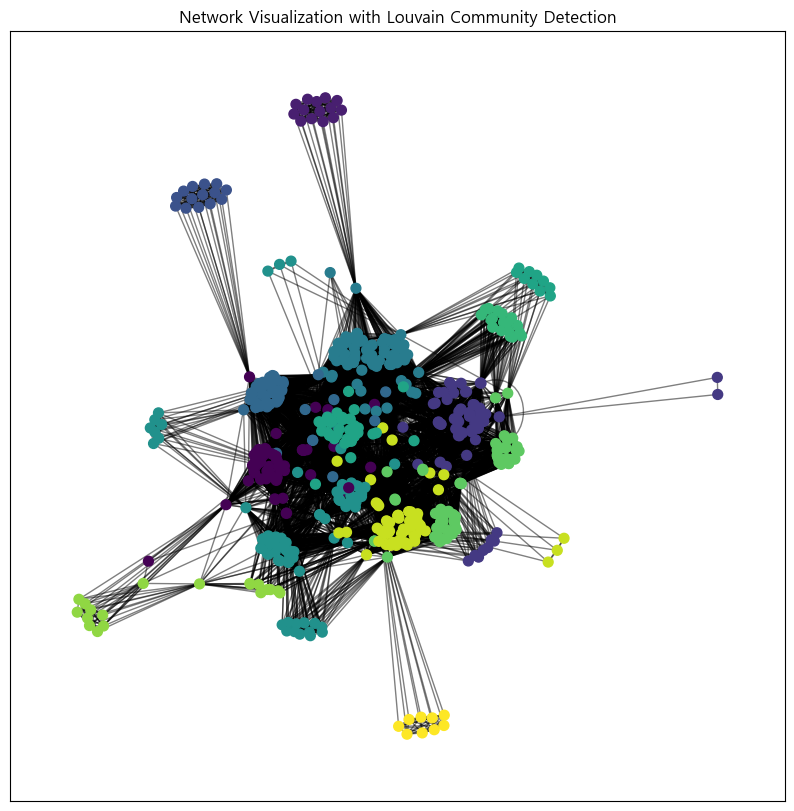

   Node  Community
0    동탄          0
1    성남         10
2    수서          0
3    구성          0
4    판교         10
5    이매          0
6    삼동         10
7  경기광주         10
8    초월         10
9   곤지암         10


In [123]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Louvain 알고리즘을 사용하여 커뮤니티 탐지
partition = community_louvain.best_partition(G)

# 커뮤니티 별로 색상 매핑
pos = nx.spring_layout(G)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=50, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Network Visualization with Louvain Community Detection")
plt.show()

# 커뮤니티의 각 노드가 어느 커뮤니티에 속하는지 결과 출력
community_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])
print(community_df.head(10))


## 3. Label Propagation 알고리즘
Label Propagation 알고리즘은 각 노드에 초기 레이블을 부여하고, 이웃 노드의 레이블 중 가장 빈번한 레이블로 갱신해 나가면서 커뮤니티를 탐지합니다.

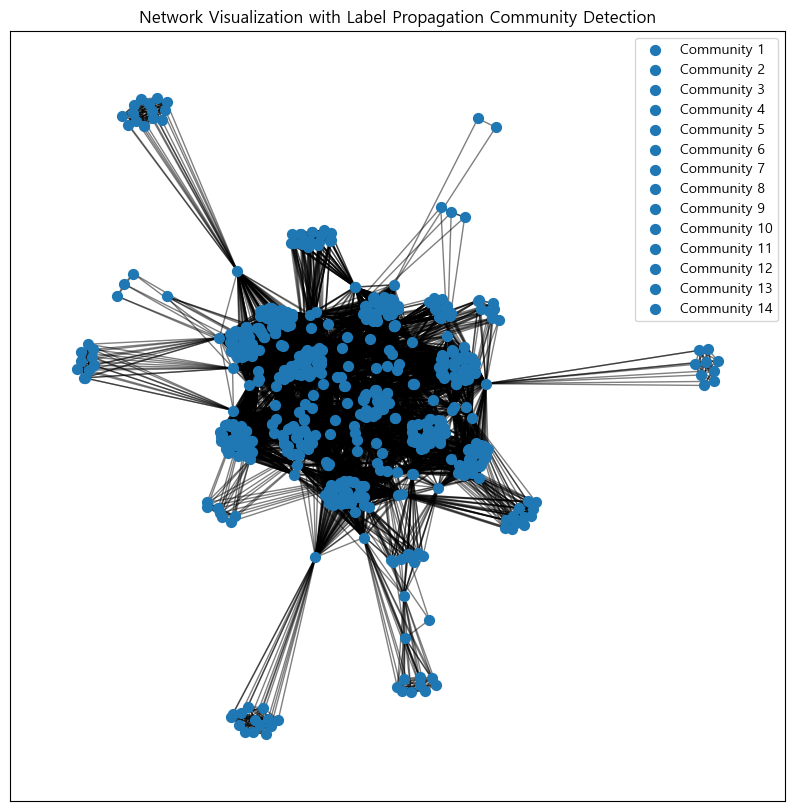

In [124]:
import networkx as nx
import matplotlib.pyplot as plt


# Label Propagation 알고리즘을 사용하여 커뮤니티 탐지
communities = nx.algorithms.community.label_propagation_communities(G)

# 커뮤니티별 노드를 리스트로 변환
communities = [list(community) for community in communities]

# 커뮤니티별로 노드를 시각화
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 10))
for i, community in enumerate(communities):
    nx.draw_networkx_nodes(G, pos, nodelist=community, node_size=50, label=f'Community {i+1}')
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Network Visualization with Label Propagation Community Detection")
plt.legend()
plt.show()


### 결과 해석:

Label Propagation 알고리즘은 매우 빠르게 커뮤니티를 탐지할 수 있으며, 노드들이 속한 커뮤니티를 시각적으로 확인할 수 있습니다.
이 알고리즘은 실행할 때마다 다른 결과를 생성할 수 있습니다. 즉, 동일한 네트워크에서 실행하더라도 커뮤니티가 다르게 탐지될 수 있습니다.
작은 커뮤니티나 덜 연결된 노드를 탐지하는 데 어려움이 있을 수 있지만, 대규모 네트워크에서는 효과적인 방법입니다.

## 4. Infomap 알고리즘
Infomap 알고리즘은 네트워크 내에서 정보 흐름을 기반으로 커뮤니티를 탐지하는 알고리즘입니다.

In [127]:
!pip install infomap

   ---------------------------------------- 0.0/564.1 kB ? eta -:--:--
   ---------------------------------------- 564.1/564.1 kB 9.4 MB/s eta 0:00:00


In [128]:
import infomap
import networkx as nx
import matplotlib.pyplot as plt

# Infomap 알고리즘을 사용하여 커뮤니티 탐지
im = infomap.Infomap()
for e in G.edges():
    im.addLink(*e)
im.run()

# 결과를 네트워크에 반영
partition = {node: im.getModules()[node] for node in G.nodes()}

# 커뮤니티별로 노드를 시각화
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 10))
cmap = plt.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, node_size=50, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Network Visualization with Infomap Community Detection")
plt.show()


TypeError: Wrong number or type of arguments for overloaded function 'InfomapWrapper_addLink'.
  Possible C/C++ prototypes are:
    infomap::InfomapWrapper::addLink(unsigned int,unsigned int,double)
    infomap::InfomapWrapper::addLink(unsigned int,unsigned int)
    infomap::InfomapWrapper::addLink(unsigned int,unsigned int,unsigned long)


## 결과 해석:

Infomap 알고리즘은 정보 흐름을 통해 자연스러운 커뮤니티 구조를 발견할 수 있습니다.
이 알고리즘은 네트워크의 실제 커뮤니티 구조를 반영할 수 있으며, 정확도가 높은 결과를 제공합니다.
다양한 네트워크에서 효과적으로 사용할 수 있습니다.

# 5. Spectral Clustering 알고리즘
Spectral Clustering은 그래프의 인접 행렬 또는 라플라시안 행렬을 사용하여 네트워크를 분할하는 알고리즘입니다.

In [129]:
from sklearn.cluster import KMeans
from sklearn.manifold import SpectralEmbedding
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Spectral Embedding을 사용하여 노드들을 저차원 공간에 매핑
n_clusters = 4  # 탐지하고자 하는 커뮤니티 수
embedding = SpectralEmbedding(n_components=n_clusters)
node_pos = embedding.fit_transform(nx.to_numpy_matrix(G))

# k-means를 사용하여 저차원 공간에서 노드들을 클러스터로 나눔
kmeans = KMeans(n_clusters=n_clusters)
labels = kmeans.fit_predict(node_pos)

# 커뮤니티별로 노드를 시각화
plt.figure(figsize=(10, 10))
for i in range(n_clusters):
    cluster_nodes = np.where(labels == i)[0]
    nx.draw_networkx_nodes(G, pos, nodelist=cluster_nodes, node_size=50, label=f'Community {i+1}')
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Network Visualization with Spectral Clustering")
plt.legend()
plt.show()


AttributeError: module 'networkx' has no attribute 'to_numpy_matrix'

## 결과 해석:

Spectral Clustering은 수학적으로 잘 정의된 방법으로, 커뮤니티가 명확하게 구분되는 경우 효과적으로 작동합니다.
이 알고리즘은 특히 겹치지 않는 커뮤니티 구조를 잘 탐지합니다.
대규모 네트워크에서는 계산 비용이 높아질 수 있지만, 그래프의 라플라시안 행렬을 사용하여 고유 벡터들을 분석함으로써 커뮤니티 구조를 찾을 수 있습니다.



# 요약 및 결과 해석
각 커뮤니티 탐지 알고리즘은 네트워크의 구조를 이해하고 분석하는 데 중요한 도구입니다. Label Propagation은 매우 빠르고 간단하지만, 결과가 비결정적일 수 있습니다. Infomap은 높은 정확도로 자연스러운 커뮤니티를 탐지하며, Spectral Clustering은 수학적으로 잘 정의된 방법으로 커뮤니티를 탐지합니다.